# Movies Data Analysis

In [1]:
%matplotlib inline
import requests
import json

import os
from tqdm import tqdm
import datetime
import pandas as pd
import csv
import subprocess

In [2]:
def get_latest(movie_id) -> dict:
    url = f"https://api.themoviedb.org/3/movie/{movie_id}?api_key=76037655f8c93e4a9ae38f2eb9cd1a76"
    retries = 0
    while retries < 500:
        try:
            response = requests.get(url)
            break
        except:
            retries += 1
            time.sleep(5)
    if response.status_code == 200:
        response_in_json = json.loads(response.text)
        movies_id = int(response_in_json['id'])
    else:
        response_in_json = {}
        
    return response_in_json

In [3]:
#api call for getting latest movie details
get_latest('latest')

{'adult': False,
 'backdrop_path': None,
 'belongs_to_collection': None,
 'budget': 0,
 'genres': [{'id': 10402, 'name': 'Music'}],
 'homepage': '',
 'id': 1277973,
 'imdb_id': None,
 'origin_country': ['US'],
 'original_language': 'sv',
 'original_title': 'Hemma hos Thore',
 'overview': 'Thore Skogman sings a medley of his songs at home.',
 'popularity': 0.0,
 'poster_path': None,
 'production_companies': [{'id': 7906,
   'logo_path': None,
   'name': 'Omega Film',
   'origin_country': 'SE'}],
 'production_countries': [{'iso_3166_1': 'SE', 'name': 'Sweden'}],
 'release_date': '1967-01-01',
 'revenue': 0,
 'runtime': 9,
 'spoken_languages': [{'english_name': 'Swedish',
   'iso_639_1': 'sv',
   'name': 'svenska'}],
 'status': 'Released',
 'tagline': '',
 'title': 'Hemma hos Thore',
 'video': False,
 'vote_average': 0.0,
 'vote_count': 0}

In [4]:
# sample data extraction using api
from tqdm import tqdm

data =[]
for i in tqdm(range(1241)):
    dict_ = get_latest(i)
    data.append(dict_)

pd.DataFrame(data).dropna(how = 'all').head()#.to_csv('TMDB_movie_dataset_v11.csv',index=False)

100%|███████████████████████████████████████| 1241/1241 [04:47<00:00,  4.32it/s]


,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,origin_country,original_language,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
2,False,/hQ4pYsIbP22TMXOUdSfC2mjWrO0.jpg,None,0.0,"[{'id': 18, 'name': 'Drama'}, {'id': 35, 'name...",,2.0,tt0094675,[FI],fi,...,1988-10-21,0.0,73.0,"[{'english_name': 'Finnish', 'iso_639_1': 'fi'...",Released,,Ariel,False,7.090,310.0
3,False,/l94l89eMmFKh7na2a1u5q67VgNx.jpg,None,0.0,"[{'id': 18, 'name': 'Drama'}, {'id': 35, 'name...",,3.0,tt0092149,[FI],fi,...,1986-10-17,0.0,74.0,"[{'english_name': 'Finnish', 'iso_639_1': 'fi'...",Released,,Shadows in Paradise,False,7.292,354.0
5,False,/f2t4JbUvQIjUF5FstG1zZFAp02N.jpg,None,4000000.0,"[{'id': 35, 'name': 'Comedy'}]",https://www.miramax.com/movie/four-rooms/,5.0,tt0113101,[US],en,...,1995-12-09,4257354.0,98.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,Twelve outrageous guests. Four scandalous requ...,Four Rooms,False,5.823,2549.0
6,False,/bGMqHn0H2UY6SPZ5Vch4YJM2jDO.jpg,None,21000000.0,"[{'id': 28, 'name': 'Action'}, {'id': 80, 'nam...",,6.0,tt0107286,[US],en,...,1993-10-15,12136938.0,109.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,Don't move. Don't whisper. Don't even breathe.,Judgment Night,False,6.500,321.0
8,False,None,None,42000.0,"[{'id': 99, 'name': 'Documentary'}]",http://lifeinloops.com,8.0,tt0825671,[AT],en,...,2006-01-01,0.0,80.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,A Megacities remix.,Life in Loops (A Megacities RMX),False,7.300,28.0


In [5]:
# Reading Data
import pandas as pd
df1=df4=pd.read_csv('TMDB_movie_dataset_v11.csv')
df1.head(2)

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,...,original_language,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,...,en,Inception,"Cobb, a skilled thief who commits corporate es...",83.952,/oYuLEt3zVCKq57qu2F8dT7NIa6f.jpg,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili"
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,...,en,Interstellar,The adventures of a group of explorers who mak...,140.241,/gEU2QniE6E77NI6lCU6MxlNBvIx.jpg,Mankind was born on Earth. It was never meant ...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English


In [6]:
df1.head(2)

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,...,original_language,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,...,en,Inception,"Cobb, a skilled thief who commits corporate es...",83.952,/oYuLEt3zVCKq57qu2F8dT7NIa6f.jpg,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili"
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,...,en,Interstellar,The adventures of a group of explorers who mak...,140.241,/gEU2QniE6E77NI6lCU6MxlNBvIx.jpg,Mankind was born on Earth. It was never meant ...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English


## Data Cleaning and Pre-processing

In [7]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 985656 entries, 0 to 985655
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    985656 non-null  int64  
 1   title                 985644 non-null  object 
 2   vote_average          985656 non-null  float64
 3   vote_count            985656 non-null  int64  
 4   status                985656 non-null  object 
 5   release_date          878749 non-null  object 
 6   revenue               985656 non-null  int64  
 7   runtime               985656 non-null  int64  
 8   adult                 985656 non-null  bool   
 9   backdrop_path         281996 non-null  object 
 10  budget                985656 non-null  int64  
 11  homepage              107008 non-null  object 
 12  imdb_id               567267 non-null  object 
 13  original_language     985656 non-null  object 
 14  original_title        985644 non-null  object 
 15  

In [8]:
df1.isnull().sum()

id                           0
title                       12
vote_average                 0
vote_count                   0
status                       0
release_date            106907
revenue                      0
runtime                      0
adult                        0
backdrop_path           703660
budget                       0
homepage                878648
imdb_id                 418389
original_language            0
original_title              12
overview                176824
popularity                   0
poster_path             267055
tagline                 843911
genres                  358912
production_companies    513260
production_countries    396302
spoken_languages        387588
dtype: int64

In [9]:
df1.columns

Index(['id', 'title', 'vote_average', 'vote_count', 'status', 'release_date',
       'revenue', 'runtime', 'adult', 'backdrop_path', 'budget', 'homepage',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'tagline', 'genres',
       'production_companies', 'production_countries', 'spoken_languages'],
      dtype='object')

In [10]:
df1.isnull().sum()

id                           0
title                       12
vote_average                 0
vote_count                   0
status                       0
release_date            106907
revenue                      0
runtime                      0
adult                        0
backdrop_path           703660
budget                       0
homepage                878648
imdb_id                 418389
original_language            0
original_title              12
overview                176824
popularity                   0
poster_path             267055
tagline                 843911
genres                  358912
production_companies    513260
production_countries    396302
spoken_languages        387588
dtype: int64

In [11]:
df1["id"].nunique()

985537

In [12]:
df1["title"].nunique()

850451

In [13]:
df1["title"].value_counts()

title
Home                        140
Untitled                    101
Alone                        89
Mother                       82
The Box                      68
                           ... 
Man Against Woman             1
Entre Visitantes              1
Brasil, 1984                  1
Asses Up! 2                   1
My Brother is Dr. Moles.      1
Name: count, Length: 850451, dtype: int64

In [14]:
df1 = df1.dropna(subset=['title'])

In [15]:
df1.shape

(985644, 23)

In [16]:
df1.status.unique()

array(['Released', 'Planned', 'Post Production', 'In Production',
       'Rumored', 'Canceled'], dtype=object)

In [17]:
#removing rows with nan as release date
df1= df1.dropna(subset=['release_date'])

In [18]:
df1.shape

(878745, 23)

In [19]:
#dropping not required columns
df1=df1.drop(columns=['backdrop_path','homepage','imdb_id','original_title','overview','poster_path','tagline'])

In [20]:
df1.shape

(878745, 16)

In [21]:
df1.head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,production_companies,production_countries,spoken_languages
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,160000000,en,83.952,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili"
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,165000000,en,140.241,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English
2,155,The Dark Knight,8.512,30619,Released,2008-07-16,1004558444,152,False,185000000,en,130.643,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin"
3,19995,Avatar,7.573,29815,Released,2009-12-15,2923706026,162,False,237000000,en,79.932,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish"
4,24428,The Avengers,7.710,29166,Released,2012-04-25,1518815515,143,False,220000000,en,98.082,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian"


In [22]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 878745 entries, 0 to 985655
Data columns (total 16 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    878745 non-null  int64  
 1   title                 878745 non-null  object 
 2   vote_average          878745 non-null  float64
 3   vote_count            878745 non-null  int64  
 4   status                878745 non-null  object 
 5   release_date          878745 non-null  object 
 6   revenue               878745 non-null  int64  
 7   runtime               878745 non-null  int64  
 8   adult                 878745 non-null  bool   
 9   budget                878745 non-null  int64  
 10  original_language     878745 non-null  object 
 11  popularity            878745 non-null  float64
 12  genres                598472 non-null  object 
 13  production_companies  458003 non-null  object 
 14  production_countries  572211 non-null  object 
 15  spoke

In [23]:
df1.isnull().sum()

id                           0
title                        0
vote_average                 0
vote_count                   0
status                       0
release_date                 0
revenue                      0
runtime                      0
adult                        0
budget                       0
original_language            0
popularity                   0
genres                  280273
production_companies    420742
production_countries    306534
spoken_languages        305980
dtype: int64

In [24]:
df1.genres.value_counts()

genres
Documentary                                116057
Drama                                       94629
Comedy                                      53620
Animation                                   27251
Music                                       22428
                                            ...  
Comedy, Action, Drama, Mystery, Fantasy         1
Adventure, Mystery, History, Thriller           1
Thriller, Drama, Romance, Fantasy               1
War, Comedy, Action                             1
Documentary, Comedy, Music, Crime               1
Name: count, Length: 12278, dtype: int64

In [25]:
df1[df1['genres']=='Documentary'].head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,production_companies,production_countries,spoken_languages
1460,899082,Harry Potter 20th Anniversary: Return to Hogwarts,7.302,3084,Released,2022-01-01,0,103,False,0,en,39.800,Documentary,"Pulse Films, Warner Horizon Unscripted Televis...","United Kingdom, United States of America",English
2785,9372,Super Size Me,6.741,1515,Released,2004-01-17,28575078,100,False,65000,en,10.989,Documentary,"Kathbur Pictures, Samuel Goldwyn Films, The Co...",United States of America,English
3178,1777,Fahrenheit 9/11,7.079,1301,Released,2004-06-25,222446882,123,False,6000000,en,13.982,Documentary,"Fellowship Adventure Group, BIM Distribuzione,...",United States of America,"English, Persian"
3449,293310,Citizenfour,7.758,1186,Released,2014-10-10,3003169,114,False,0,en,9.308,Documentary,"Praxis Films, Participant, HBO Documentary Fil...","Germany, United Kingdom, United States of America","English, German, Portuguese"
3703,691179,Friends: The Reunion,7.900,1082,Released,2021-05-27,0,104,False,0,en,19.691,Documentary,"Bright/Kauffman/Crane Productions, Warner Hori...",United States of America,English


In [26]:
df1.describe()

,id,vote_average,vote_count,revenue,runtime,budget,popularity
count,8.787450e+05,878745.000000,878745.000000,8.787450e+05,878745.000000,8.787450e+05,878745.000000
mean,6.209214e+05,2.338493,24.393680,8.249405e+05,54.509407,3.219044e+05,1.470486
std,3.429927e+05,3.179571,362.060241,1.865187e+07,63.062913,5.250287e+06,8.611375
min,2.000000e+00,0.000000,0.000000,-1.200000e+01,0.000000,0.000000e+00,0.000000
25%,3.412780e+05,0.000000,0.000000,0.000000e+00,4.000000,0.000000e+00,0.600000
50%,6.135920e+05,0.000000,0.000000,0.000000e+00,50.000000,0.000000e+00,0.600000
75%,9.150260e+05,5.500000,2.000000,0.000000e+00,91.000000,0.000000e+00,1.032000
max,1.237356e+06,10.000000,34495.000000,3.000000e+09,14400.000000,8.880000e+08,2994.357000


In [27]:
df1['vote_average'].value_counts()

vote_average
0.000     538880
6.000      29715
5.000      29427
7.000      23168
10.000     20883
           ...  
8.449          1
3.657          1
2.402          1
8.127          1
0.750          1
Name: count, Length: 5023, dtype: int64

In [28]:
df1[df1['vote_average']==0].head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,production_companies,production_countries,spoken_languages
151156,376967,Home Invader,0.0,3,Released,2016-04-08,0,0,False,200,en,0.600,Thriller,NaN,United States of America,English
151441,397117,MMXII,0.0,3,Released,2016-11-11,0,108,False,0,en,0.703,"Adventure, Drama",Natural Wonders Productions,United States of America,English
161728,255487,The Boyfriend,0.0,3,Released,2015-02-11,0,110,False,150000,en,0.600,"Drama, Romance",Productive Film,United Kingdom,English
162389,479352,Winter Hunt,0.0,3,Released,2019-06-26,0,78,False,0,de,0.987,"Thriller, Drama",ZDF,Germany,German
163087,472957,Dark Is the Night,0.0,3,Released,2018-08-15,0,106,False,0,tl,0.758,Drama,"Oro de Siete Productions Inc., Swift Productions",Philippines,Tagalog


In [29]:
df1['vote_count'].value_counts()

vote_count
0        538671
1        116590
2         48500
3         28512
4         20742
          ...  
3339          1
3338          1
1343          1
1345          1
34495         1
Name: count, Length: 3598, dtype: int64

In [30]:
df1['status'].value_counts()

status
Released           875167
In Production        1990
Post Production      1219
Planned               355
Rumored                 8
Canceled                6
Name: count, dtype: int64

In [31]:
df1['release_date'] = pd.to_datetime(df1['release_date'])
df1['release_date'].dt.month.unique()

array([ 7, 11, 12,  4,  2, 10,  9,  6,  3,  5,  8,  1], dtype=int32)

In [32]:
df1['release_date'].dt.year.unique()

array([2010, 2014, 2008, 2009, 2012, 2016, 2018, 1999, 1994, 2001, 2019,
       1997, 2003, 2013, 2015, 2017, 2002, 2011, 2004, 2005, 1995, 1977,
       1972, 1985, 2021, 2007, 2000, 1998, 1980, 1993, 1991, 2006, 1983,
       1992, 1979, 1982, 1990, 1971, 1984, 1989, 1981, 1974, 1976, 1968,
       1988, 2022, 1987, 2020, 1975, 1960, 1996, 1986, 1966, 1957, 1973,
       1937, 1978, 2023, 1950, 1954, 1961, 1967, 1951, 1940, 1958, 1942,
       1939, 1964, 1941, 1953, 1943, 1955, 1959, 1970, 1946, 1963, 1965,
       1936, 1962, 1952, 1927, 1948, 1969, 1931, 1921, 1922, 1949, 1944,
       1902, 1925, 1956, 1920, 1933, 1929, 1934, 1926, 1932, 1938, 1924,
       1935, 1928, 1945, 1930, 1947, 1903, 1915, 1923, 1897, 1916, 1895,
       1918, 1917, 1911, 1919, 1910, 1888, 1898, 1904, 1896, 1901, 1914,
       1908, 1900, 1899, 1874, 1912, 1894, 1893, 1890, 1892, 1909, 1887,
       1913, 1905, 1891, 1906, 1907, 1885, 1878, 1889, 1882, 2024, 2025,
       1865, 2026, 2029, 1883, 2027, 1800, 2032, 18

In [33]:
df1['release_date'].dt.day.unique()

array([15,  5, 16, 25,  9, 30, 10, 23, 24, 18,  1, 14, 22, 27, 17, 13, 19,
       12,  3, 31, 21, 28,  2,  6,  8, 20,  4, 29, 11, 26,  7],
      dtype=int32)

In [34]:
from datetime import datetime
aa = df1[df1['status']=='Released']
aa[aa['release_date']>datetime.now()].shape

(55, 16)

In [35]:
aa = df1[df1['status']=='In Production']
aa[aa['release_date']<datetime.now()].shape

(1702, 16)

In [36]:
aa = df1[df1['status']=='Post Production']
aa[aa['release_date']<datetime.now()].shape

(1137, 16)

In [37]:
# making sure that if the status of movie is released then its release date should be less than todays date.
df1=df1[~((df1['status'] == 'Released') & (df1['release_date'] > datetime.now()))]
df1=df1[df1['status']=='Released']
df1.shape

(875112, 16)

In [38]:
df1=df1[~df1['revenue']<0]
df1.shape

(875111, 16)

In [39]:
df1['runtime'].value_counts()

runtime
0      184725
90      26837
10      13670
7       12576
5       12298
        ...  
607         1
584         1
653         1
820         1
539         1
Name: count, Length: 692, dtype: int64

In [40]:
df1['runtime'].describe()

count    875111.000000
mean         54.613681
std          63.105272
min           0.000000
25%           4.000000
50%          50.000000
75%          91.000000
max       14400.000000
Name: runtime, dtype: float64

In [41]:
df1=df1[df1['runtime']>0]
df1.shape

(690386, 16)

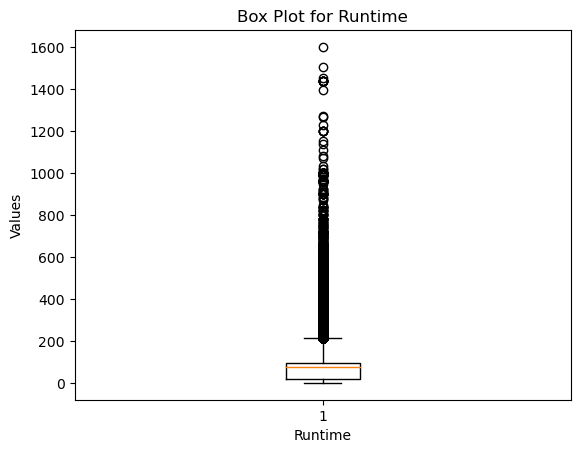

In [42]:
import matplotlib.pyplot as plt
import numpy as np

plt.boxplot(df1[df1['runtime']<2000]['runtime'])

plt.xlabel('Runtime')
plt.ylabel('Values')
plt.title('Box Plot for Runtime')

plt.show()


In [43]:
# Capping runtime to 300 minutes
df1.loc[df1['runtime']>=300,'runtime']=300

In [44]:
df1['runtime'].describe()

count    690386.000000
mean         68.623380
std          49.898392
min           1.000000
25%          19.000000
50%          75.000000
75%          97.000000
max         300.000000
Name: runtime, dtype: float64

In [45]:
df1['adult'].unique()

array([False,  True])

In [46]:
df1['budget'].value_counts()

budget
0          653299
10000         951
100           772
1000          765
5000          762
            ...  
453500          1
7492030         1
13125           1
413             1
83691           1
Name: count, Length: 4571, dtype: int64

In [47]:
df1['budget'].describe()

count    6.903860e+05
mean     4.013349e+05
std      5.723091e+06
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      8.880000e+08
Name: budget, dtype: float64

In [48]:
(df1['release_date'].dt.year.unique())

array([2010, 2014, 2008, 2009, 2012, 2016, 2018, 1999, 1994, 2001, 2019,
       1997, 2003, 2013, 2015, 2017, 2002, 2011, 2004, 2005, 1995, 1977,
       1972, 1985, 2021, 2007, 2000, 1998, 1980, 1993, 1991, 2006, 1983,
       1992, 1979, 1982, 1990, 1971, 1984, 1989, 1981, 1974, 1976, 1968,
       1988, 2022, 1987, 2020, 1975, 1960, 1996, 1986, 1966, 1957, 1973,
       1937, 1978, 2023, 1950, 1954, 1961, 1967, 1951, 1940, 1958, 1942,
       1939, 1964, 1941, 1953, 1943, 1955, 1959, 1970, 1946, 1963, 1965,
       1936, 1962, 1952, 1927, 1948, 1969, 1931, 1921, 1922, 1949, 1944,
       1902, 1925, 1956, 1920, 1933, 1929, 1934, 1926, 1932, 1938, 1924,
       1935, 1928, 1945, 1930, 1947, 1903, 1915, 1923, 1897, 1916, 1895,
       1918, 1917, 1911, 1919, 1910, 1888, 1898, 1904, 1896, 1901, 1914,
       1908, 1900, 1899, 1874, 1912, 1894, 1893, 1890, 1892, 1909, 1887,
       1913, 1905, 1891, 1906, 1907, 1885, 1878, 1889, 1882, 2024, 1865,
       1883, 1800, 1867], dtype=int32)

In [49]:
df1.shape

(690386, 16)

In [50]:
df1[df1['budget'] == 0].head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,production_companies,production_countries,spoken_languages
258,372058,Your Name.,8.514,10303,Released,2016-08-26,357986087,106,False,0,ja,68.999,"Romance, Animation, Drama","CoMix Wave Films, TOHO, KADOKAWA, East Japan M...",Japan,Japanese
375,664413,365 Days,7.063,8429,Released,2020-02-07,9458590,116,False,0,pl,32.781,"Romance, Drama","Ekipa, Future Space, Next Film, TVN Group",Poland,"English, French, Italian, Polish"
395,466282,To All the Boys I've Loved Before,7.642,8045,Released,2018-08-16,0,100,False,0,en,38.926,"Comedy, Romance","Awesomeness Films, Overbrook Entertainment",United States of America,English
509,454983,The Kissing Booth,7.229,6926,Released,2018-05-11,0,105,False,0,en,36.649,"Romance, Comedy",Komixx Entertainment,United Kingdom,English
652,200727,"Love, Rosie",7.837,5918,Released,2014-10-16,4439431,102,False,0,en,29.428,"Romance, Drama, Comedy","Constantin Film, Octagon Films, Canyon Creek F...","Belgium, Canada, Germany, Ireland, United Kingdom",English


In [51]:
df1[df1['budget'] == 0].shape

(653299, 16)

In [52]:
df1.describe()

,id,vote_average,vote_count,release_date,revenue,runtime,budget,popularity
count,6.903860e+05,690386.000000,690386.00000,690386,6.903860e+05,690386.000000,6.903860e+05,690386.000000
mean,5.956176e+05,2.607500,30.90367,1999-09-23 19:42:31.932397440,1.045639e+06,68.623380,4.013349e+05,1.659754
min,2.000000e+00,0.000000,0.00000,1800-09-11 00:00:00,0.000000e+00,1.000000,0.000000e+00,0.000000
25%,3.186352e+05,0.000000,0.00000,1989-01-01 00:00:00,0.000000e+00,19.000000,0.000000e+00,0.600000
50%,5.846205e+05,0.000000,0.00000,2010-04-27 00:00:00,0.000000e+00,75.000000,0.000000e+00,0.600000
75%,8.783958e+05,5.800000,2.00000,2018-06-01 00:00:00,0.000000e+00,97.000000,0.000000e+00,1.179000
max,1.237356e+06,10.000000,34495.00000,2024-04-16 00:00:00,3.000000e+09,300.000000,8.880000e+08,2994.357000
std,3.435980e+05,3.226772,408.22995,NaN,2.100474e+07,49.898392,5.723091e+06,9.657127


In [53]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 690386 entries, 0 to 985655
Data columns (total 16 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    690386 non-null  int64         
 1   title                 690386 non-null  object        
 2   vote_average          690386 non-null  float64       
 3   vote_count            690386 non-null  int64         
 4   status                690386 non-null  object        
 5   release_date          690386 non-null  datetime64[ns]
 6   revenue               690386 non-null  int64         
 7   runtime               690386 non-null  int64         
 8   adult                 690386 non-null  bool          
 9   budget                690386 non-null  int64         
 10  original_language     690386 non-null  object        
 11  popularity            690386 non-null  float64       
 12  genres                491482 non-null  object        
 13  prod

In [54]:
df1[["title","vote_average","vote_count","release_date","original_language","popularity"]].head()

,title,vote_average,vote_count,release_date,original_language,popularity
0,Inception,8.364,34495,2010-07-15,en,83.952
1,Interstellar,8.417,32571,2014-11-05,en,140.241
2,The Dark Knight,8.512,30619,2008-07-16,en,130.643
3,Avatar,7.573,29815,2009-12-15,en,79.932
4,The Avengers,7.710,29166,2012-04-25,en,98.082


In [55]:
df1["status"].value_counts()

status
Released    690386
Name: count, dtype: int64

In [56]:
for i in df1.columns:
    print(df1[i].value_counts())

id
1205264    2
1192957    2
1213633    2
1210318    2
1206572    2
          ..
672399     1
204107     1
922956     1
80404      1
1237153    1
Name: count, Length: 690378, dtype: int64
title
Home                                    110
Alone                                    79
Untitled                                 74
Mother                                   73
Silence                                  58
                                       ... 
Bathroom Hooligan                         1
Oranges amères                            1
ZODIAC CRUSH                              1
No andaba muerto, estaba de parranda      1
My Brother is Dr. Moles.                  1
Name: count, Length: 592348, dtype: int64
vote_average
0.000     390999
6.000      25212
5.000      23326
7.000      19432
10.000     16181
           ...  
8.279          1
3.657          1
2.402          1
8.127          1
0.750          1
Name: count, Length: 5013, dtype: int64
vote_count
0        390859
1         919

In [57]:
df1[["vote_average","vote_count","revenue","popularity"]].corr()

,vote_average,vote_count,revenue,popularity
vote_average,1.000000,0.099104,0.063800,0.113950
vote_count,0.099104,1.000000,0.760886,0.253030
revenue,0.063800,0.760886,1.000000,0.247715
popularity,0.113950,0.253030,0.247715,1.000000


In [58]:
df1['original_language'].unique()

array(['en', 'ko', 'fr', 'ja', 'it', 'es', 'pl', 'pt', 'hi', 'tr', 'da',
       'de', 'cn', 'id', 'zh', 'sv', 'el', 'ru', 'sr', 'fa', 'th', 'ar',
       'no', 'nb', 'fi', 'te', 'la', 'nl', 'hu', 'he', 'is', 'ro', 'gl',
       'uk', 'eu', 'et', 'bs', 'bn', 'xx', 'sh', 'km', 'cs', 'tn', 'ml',
       'mk', 'ga', 'hy', 'ku', 'ka', 'ta', 'kn', 'tl', 'vi', 'ca', 'dz',
       'sw', 'wo', 'kk', 'sk', 'lv', 'mi', 'bo', 'mn', 'ps', 'lt', 'ur',
       'sl', 'sc', 'af', 'hr', 'iu', 'se', 'ms', 'bm', 'mr', 'bg', 'lo',
       'cy', 'am', 'xh', 'qu', 'yi', 'yo', 'pa', 'sq', 'eo', 'gu', 'zu',
       'st', 'ne', 'ak', 'mt', 'rw', 'ay', 'ln', 'as', 'mo', 'si', 'ff',
       'so', 'ky', 'az', 'ab', 'ik', 'kl', 'jv', 'fo', 'sn', 'li', 'my',
       'ks', 'su', 'tg', 'ht', 'lb', 'sm', 'rm', 'ha', 'sa', 'tk', 'fy',
       'or', 'bi', 'ny', 'gd', 'be', 'om', 'uz', 'cr', 'mg', 'mh', 'tw',
       'co', 'nn', 'gn', 'ug', 'nv', 'tt', 'os', 'ig', 'ie', 'kw', 'dv',
       'sg', 'nd', 'to', 'kg', 'ti', 'ce', 'oc', 'c

In [59]:
# mapping the language codes with actual language names
language_codes = {
    'en': 'English', 'ko': 'Korean', 'fr': 'French', 'ja': 'Japanese', 'it': 'Italian',
    'es': 'Spanish', 'pl': 'Polish', 'pt': 'Portuguese', 'hi': 'Hindi', 'tr': 'Turkish',
    'da': 'Danish', 'de': 'German', 'cn': 'Chinese', 'id': 'Indonesian', 'zh': 'Chinese',
    'sv': 'Swedish', 'el': 'Greek', 'ru': 'Russian', 'sr': 'Serbian', 'fa': 'Persian',
    'th': 'Thai', 'ar': 'Arabic', 'no': 'Norwegian', 'nb': 'Norwegian Bokmål',
    'fi': 'Finnish', 'te': 'Telugu', 'la': 'Latin', 'nl': 'Dutch', 'hu': 'Hungarian',
    'he': 'Hebrew', 'is': 'Icelandic', 'ro': 'Romanian', 'gl': 'Galician', 'uk': 'Ukrainian',
    'eu': 'Basque', 'et': 'Estonian', 'bs': 'Bosnian', 'bn': 'Bengali', 'xx': 'Unknown',
    'sh': 'Serbo-Croatian', 'km': 'Khmer', 'cs': 'Czech', 'tn': 'Tswana', 'ml': 'Malayalam',
    'mk': 'Macedonian', 'ga': 'Irish', 'hy': 'Armenian', 'ku': 'Kurdish', 'ka': 'Georgian',
    'ta': 'Tamil', 'kn': 'Kannada', 'tl': 'Tagalog', 'vi': 'Vietnamese', 'ca': 'Catalan',
    'dz': 'Dzongkha', 'sw': 'Swahili', 'wo': 'Wolof', 'kk': 'Kazakh', 'sk': 'Slovak',
    'lv': 'Latvian', 'mi': 'Maori', 'bo': 'Tibetan', 'mn': 'Mongolian', 'ps': 'Pashto',
    'lt': 'Lithuanian', 'ur': 'Urdu', 'sl': 'Slovenian', 'sc': 'Sardinian', 'af': 'Afrikaans',
    'hr': 'Croatian', 'iu': 'Inuktitut', 'se': 'Northern Sami', 'ms': 'Malay',
    'bm': 'Bambara', 'mr': 'Marathi', 'bg': 'Bulgarian', 'lo': 'Lao', 'cy': 'Welsh',
    'am': 'Amharic', 'xh': 'Xhosa', 'qu': 'Quechua', 'yi': 'Yiddish', 'yo': 'Yoruba',
    'pa': 'Punjabi', 'sq': 'Albanian', 'eo': 'Esperanto', 'gu': 'Gujarati', 'zu': 'Zulu',
    'st': 'Southern Sotho', 'ne': 'Nepali', 'ak': 'Akan', 'mt': 'Maltese', 'rw': 'Kinyarwanda',
    'ay': 'Aymara', 'ln': 'Lingala', 'as': 'Assamese', 'mo': 'Moldovan', 'si': 'Sinhala',
    'ff': 'Fulah', 'so': 'Somali', 'ky': 'Kyrgyz', 'az': 'Azerbaijani', 'ab': 'Abkhazian',
    'ik': 'Inupiaq', 'kl': 'Kalaallisut', 'jv': 'Javanese', 'fo': 'Faroese', 'sn': 'Shona',
    'li': 'Limburgish', 'my': 'Burmese', 'ks': 'Kashmiri', 'su': 'Sundanese', 'tg': 'Tajik',
    'ht': 'Haitian Creole', 'lb': 'Luxembourgish', 'sm': 'Samoan', 'rm': 'Romansh',
    'ha': 'Hausa', 'sa': 'Sanskrit', 'tk': 'Turkmen', 'fy': 'Western Frisian', 'or': 'Oriya',
    'bi': 'Bislama', 'ny': 'Chichewa', 'gd': 'Scottish Gaelic', 'be': 'Belarusian',
    'om': 'Oromo', 'uz': 'Uzbek', 'cr': 'Cree', 'mg': 'Malagasy', 'mh': 'Marshallese',
    'tw': 'Twi', 'co': 'Corsican', 'nn': 'Norwegian Nynorsk', 'gn': 'Guarani', 'ug': 'Uighur',
    'nv': 'Navajo', 'tt': 'Tatar', 'os': 'Ossetian', 'ig': 'Igbo', 'ie': 'Interlingue',
    'kw': 'Cornish', 'dv': 'Divehi', 'sg': 'Sango', 'nd': 'Northern Ndebele', 'to': 'Tongan',
    'kg': 'Kongo', 'ti': 'Tigrinya', 'ce': 'Chechen', 'oc': 'Occitan', 'cv': 'Chuvash',
    'kv': 'Komi', 'kj': 'Kuanyama', 'lg': 'Ganda', 'br': 'Breton', 'oj': 'Ojibwa',
    'ch': 'Chamorro', 'hz': 'Herero', 'ty': 'Tahitian', 'ia': 'Interlingua', 'aa': 'Afar',
    'ba': 'Bashkir', 'ki': 'Kikuyu', 'ss': 'Swati', 'rn': 'Rundi', 'fj': 'Fijian',
    'sd': 'Sindhi', 'gv': 'Manx', 'ii': 'Sichuan Yi', 'ts': 'Tsonga'
}

df1['original_language'] = df1['original_language'].map(language_codes)


In [60]:
df1['original_language'].unique()

array(['English', 'Korean', 'French', 'Japanese', 'Italian', 'Spanish',
       'Polish', 'Portuguese', 'Hindi', 'Turkish', 'Danish', 'German',
       'Chinese', 'Indonesian', 'Swedish', 'Greek', 'Russian', 'Serbian',
       'Persian', 'Thai', 'Arabic', 'Norwegian', 'Norwegian Bokmål',
       'Finnish', 'Telugu', 'Latin', 'Dutch', 'Hungarian', 'Hebrew',
       'Icelandic', 'Romanian', 'Galician', 'Ukrainian', 'Basque',
       'Estonian', 'Bosnian', 'Bengali', 'Unknown', 'Serbo-Croatian',
       'Khmer', 'Czech', 'Tswana', 'Malayalam', 'Macedonian', 'Irish',
       'Armenian', 'Kurdish', 'Georgian', 'Tamil', 'Kannada', 'Tagalog',
       'Vietnamese', 'Catalan', 'Dzongkha', 'Swahili', 'Wolof', 'Kazakh',
       'Slovak', 'Latvian', 'Maori', 'Tibetan', 'Mongolian', 'Pashto',
       'Lithuanian', 'Urdu', 'Slovenian', 'Sardinian', 'Afrikaans',
       'Croatian', 'Inuktitut', 'Northern Sami', 'Malay', 'Bambara',
       'Marathi', 'Bulgarian', 'Lao', 'Welsh', 'Amharic', 'Xhosa',
       'Quechua

In [61]:
df1['popularity'].describe()

count    690386.000000
mean          1.659754
std           9.657127
min           0.000000
25%           0.600000
50%           0.600000
75%           1.179000
max        2994.357000
Name: popularity, dtype: float64

In [62]:
df1[df1['popularity']==2994.357000]

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,production_companies,production_countries,spoken_languages
3870,565770,Blue Beetle,7.139,1023,Released,2023-08-16,124818235,128,False,120000000,English,2994.357,"Action, Science Fiction, Adventure","Warner Bros. Pictures, The Safran Company, DC ...",United States of America,"English, Portuguese, Spanish"


In [63]:
genres_dummies = df1['genres'].str.get_dummies(', ')
genres_dummies = genres_dummies.astype(bool)

df1 = pd.concat([df1, genres_dummies], axis=1)


In [64]:
df1.head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,...,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,160000000,...,False,False,False,False,False,True,False,False,False,False
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,165000000,...,False,False,False,False,False,True,False,False,False,False
2,155,The Dark Knight,8.512,30619,Released,2008-07-16,1004558444,152,False,185000000,...,False,False,False,False,False,False,False,True,False,False
3,19995,Avatar,7.573,29815,Released,2009-12-15,2923706026,162,False,237000000,...,False,False,False,False,False,True,False,False,False,False
4,24428,The Avengers,7.710,29166,Released,2012-04-25,1518815515,143,False,220000000,...,False,False,False,False,False,True,False,False,False,False


In [65]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 690386 entries, 0 to 985655
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    690386 non-null  int64         
 1   title                 690386 non-null  object        
 2   vote_average          690386 non-null  float64       
 3   vote_count            690386 non-null  int64         
 4   status                690386 non-null  object        
 5   release_date          690386 non-null  datetime64[ns]
 6   revenue               690386 non-null  int64         
 7   runtime               690386 non-null  int64         
 8   adult                 690386 non-null  bool          
 9   budget                690386 non-null  int64         
 10  original_language     690386 non-null  object        
 11  popularity            690386 non-null  float64       
 12  genres                491482 non-null  object        
 13  prod

In [66]:
df1['production_companies'].unique()

array(['Legendary Pictures, Syncopy, Warner Bros. Pictures',
       'Legendary Pictures, Syncopy, Lynda Obst Productions',
       'DC Comics, Legendary Pictures, Syncopy, Isobel Griffiths, Warner Bros. Pictures',
       ..., 'Check Six Productions',
       'Paragon Home Video, Queeriosity Video Project',
       'Making Movies, Finnish Film Foundation, AVEK, YLE'], dtype=object)

In [67]:
df1['production_countries'].unique()

array(['United Kingdom, United States of America',
       'United States of America, United Kingdom',
       'United States of America', ..., 'China, Indonesia',
       'Belarus, Canada, Thailand, United States of America',
       'Senegal, South Africa'], dtype=object)

In [68]:
df1['spoken_languages'].unique()

array(['English, French, Japanese, Swahili', 'English',
       'English, Mandarin', ..., 'German, Raeto-Romance, Serbian',
       'Assamese, Bengali, Gujarati, Malayalam, Marathi, Punjabi, Tamil, Telugu',
       'Norwegian, Russian, Spanish'], dtype=object)

In [69]:
df1=df1.drop(columns=['id','status'])

In [70]:
df1.head()

,title,vote_average,vote_count,release_date,revenue,runtime,adult,budget,original_language,popularity,...,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western
0,Inception,8.364,34495,2010-07-15,825532764,148,False,160000000,English,83.952,...,False,False,False,False,False,True,False,False,False,False
1,Interstellar,8.417,32571,2014-11-05,701729206,169,False,165000000,English,140.241,...,False,False,False,False,False,True,False,False,False,False
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,False,185000000,English,130.643,...,False,False,False,False,False,False,False,True,False,False
3,Avatar,7.573,29815,2009-12-15,2923706026,162,False,237000000,English,79.932,...,False,False,False,False,False,True,False,False,False,False
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,False,220000000,English,98.082,...,False,False,False,False,False,True,False,False,False,False


In [71]:
df1=df1.drop_duplicates()

In [72]:
df1.shape

(690359, 33)

In [73]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df1.head(10)

,title,vote_average,vote_count,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,production_companies,production_countries,spoken_languages,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western
0,Inception,8.364,34495,2010-07-15,825532764,148,False,160000000,English,83.952,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
1,Interstellar,8.417,32571,2014-11-05,701729206,169,False,165000000,English,140.241,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English,False,True,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,False,185000000,English,130.643,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin",True,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False
3,Avatar,7.573,29815,2009-12-15,2923706026,162,False,237000000,English,79.932,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish",True,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,False,220000000,English,98.082,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
5,Deadpool,7.606,28894,2016-02-09,783100000,108,False,58000000,English,72.735,"Action, Adventure, Comedy","20th Century Fox, The Donners' Company, Genre ...",United States of America,English,True,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,Avengers: Infinity War,8.255,27713,2018-04-25,2052415039,149,False,300000000,English,154.340,"Adventure, Action, Science Fiction",Marvel Studios,United States of America,"English, Xhosa",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
7,Fight Club,8.438,27238,1999-10-15,100853753,139,False,63000000,English,69.498,Drama,"Regency Enterprises, Fox 2000 Pictures, Taurus...",United States of America,English,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
8,Guardians of the Galaxy,7.906,26638,2014-07-30,772776600,121,False,170000000,English,33.255,"Action, Science Fiction, Adventure",Marvel Studios,United States of America,English,True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
9,Pulp Fiction,8.488,25893,1994-09-10,213900000,154,False,8500000,English,74.862,"Thriller, Crime","Miramax, A Band Apart, Jersey Films",United States of America,"English, Spanish, French",False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False


# Visualizations

In [74]:
df1.describe()

,vote_average,vote_count,release_date,revenue,runtime,budget,popularity
count,690359.000000,690359.000000,690359,6.903590e+05,690359.000000,6.903590e+05,690359.000000
mean,2.607602,30.904878,1999-09-23 15:51:26.708799360,1.045680e+06,68.624355,4.013506e+05,1.659805
min,0.000000,0.000000,1800-09-11 00:00:00,0.000000e+00,1.000000,0.000000e+00,0.000000
25%,0.000000,0.000000,1989-01-01 00:00:00,0.000000e+00,19.000000,0.000000e+00,0.600000
50%,0.000000,0.000000,2010-04-27 00:00:00,0.000000e+00,75.000000,0.000000e+00,0.600000
75%,5.800000,2.000000,2018-06-01 00:00:00,0.000000e+00,97.000000,0.000000e+00,1.179000
max,10.000000,34495.000000,2024-04-16 00:00:00,3.000000e+09,300.000000,8.880000e+08,2994.357000
std,3.226794,408.237887,NaN,2.100515e+07,49.898401,5.723202e+06,9.657312


In [75]:
len(df1["budget"].dropna())

690359

In [76]:
# Choosing records where budget is not equal to zero
df2=df1[df1["budget"]!=0]

In [77]:
# Choosing record where revenue is not equal to zero
df2=df2[df2["revenue"]!=0]

In [78]:
df2.shape

(11210, 33)

In [79]:
df2.columns

#Checking null values

df2.isnull().sum()

df2[["original_language","spoken_languages"]].isnull()

df2[df2["spoken_languages"].isnull()]

df2[df2["spoken_languages"].isnull()]

temp=df2[df2["spoken_languages"].isnull()]["original_language"].reset_index()

temp.set_index("index")

keys=temp["index"].values

values=temp["original_language"].values

result_dict = {keys[i]: values[i] for i in range(len(keys))}

result_dict

for idx in df2.index:
    if pd.isnull(df2.at[idx, 'spoken_languages']):
        if idx in result_dict:
            df2.at[idx, 'spoken_languages'] = result_dict[idx]

df2[df2["genres"].isnull()]

df2.shape

df2.dropna(subset=['genres'], inplace=True)

df2.shape

df2.isnull().sum()

temp=df2[df2["production_countries"].isnull()|df2["production_companies"].isnull()]

temp.shape

df2.drop(columns=["production_companies","production_countries"],inplace=True)

df2.shape

(11047, 31)

In [80]:
import matplotlib.pyplot as plt

In [81]:
import seaborn as sns

In [82]:
df2[(df2["budget"]<1000) | (df2["revenue"]<1000)].shape

(926, 31)

In [83]:
# Choosing records where budget and revenue values are over 1000 dollars for drawing better visualizations
df2=df2[(df2["budget"]>=1000) & (df2["revenue"]>=1000)]

In [84]:
df2.shape

(10121, 31)

In [85]:
df2.describe()

,vote_average,vote_count,release_date,revenue,runtime,budget,popularity
count,10121.000000,10121.000000,10121,1.012100e+04,10121.000000,1.012100e+04,10121.000000
mean,6.194371,1510.355498,2001-09-27 18:30:20.452524544,6.628535e+07,107.522972,2.355113e+07,19.113298
min,0.000000,0.000000,1913-11-24 00:00:00,1.000000e+03,1.000000,1.000000e+03,0.000000
25%,5.770000,61.000000,1995-03-10 00:00:00,1.802142e+06,93.000000,2.000000e+06,6.231000
50%,6.405000,391.000000,2007-02-09 00:00:00,1.274189e+07,104.000000,1.000000e+07,12.973000
75%,7.024000,1527.000000,2014-09-05 00:00:00,5.781444e+07,120.000000,2.794186e+07,20.425000
max,10.000000,34495.000000,2024-01-19 00:00:00,3.000000e+09,300.000000,8.000000e+08,2994.357000
std,1.614834,2965.769794,NaN,1.584094e+08,26.574437,3.866550e+07,61.309130


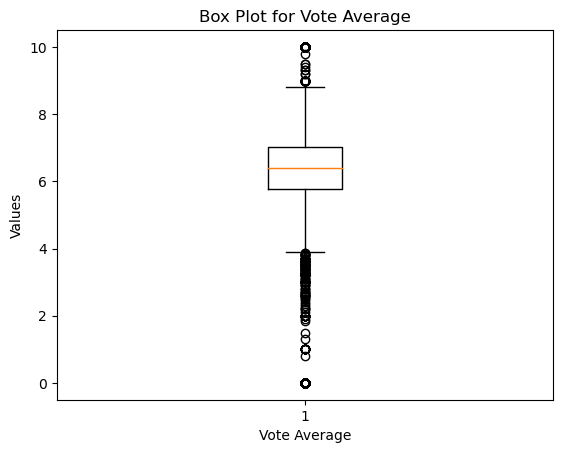

In [86]:
# Box plot for Vote Average
plt.boxplot(df2[["vote_average"]])
plt.title("Box Plot for Vote Average")
plt.xlabel("Vote Average")
plt.ylabel("Values")
plt.show()

The above box plot is plotted to look at the data distribution of vote averages. This is done to find out where the data points for vote averages are more concentrated at and also to find out if there are any outliers.

Inference: 

From the above box plot, we can infer that the first quartile value of vote average is close to 6, mean value is approximately 6.5 and third quartile is approximately 7. Though there are large number of data points away from the whiskers, these are not considered outlier values because these values are in the range of (0,10) for vote averages which makes sense that the vote average can be any value on a scale of 10.

In [87]:
df2.columns

Index(['title', 'vote_average', 'vote_count', 'release_date', 'revenue',
       'runtime', 'adult', 'budget', 'original_language', 'popularity',
       'genres', 'spoken_languages', 'Action', 'Adventure', 'Animation',
       'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy',
       'History', 'Horror', 'Music', 'Mystery', 'Romance', 'Science Fiction',
       'TV Movie', 'Thriller', 'War', 'Western'],
      dtype='object')

In [88]:
df2.head()

,title,vote_average,vote_count,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,spoken_languages,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western
0,Inception,8.364,34495,2010-07-15,825532764,148,False,160000000,English,83.952,"Action, Science Fiction, Adventure","English, French, Japanese, Swahili",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
1,Interstellar,8.417,32571,2014-11-05,701729206,169,False,165000000,English,140.241,"Adventure, Drama, Science Fiction",English,False,True,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,False,185000000,English,130.643,"Drama, Action, Crime, Thriller","English, Mandarin",True,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False
3,Avatar,7.573,29815,2009-12-15,2923706026,162,False,237000000,English,79.932,"Action, Adventure, Fantasy, Science Fiction","English, Spanish",True,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,False,220000000,English,98.082,"Science Fiction, Action, Adventure","English, Hindi, Russian",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False


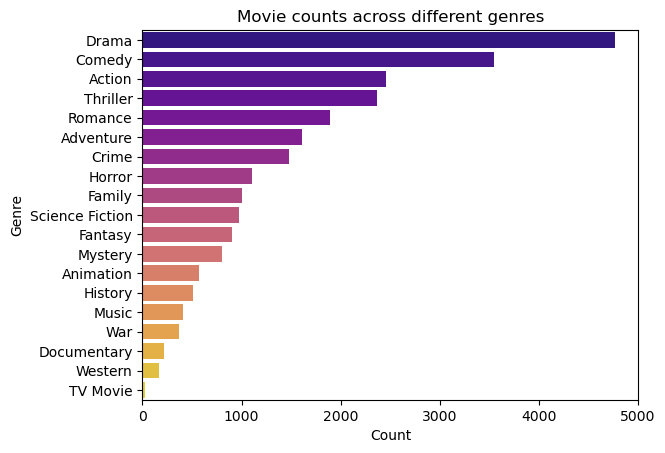

In [89]:
temp=df2.iloc[:,12:].sum().sort_values(ascending=False).reset_index()

temp

temp.columns

# Looking at movie counts by each genre
sns.barplot(y=temp["index"],x=temp[0],palette="plasma")
plt.title("Movie counts across different genres")
plt.xlabel("Count")
plt.ylabel("Genre")
plt.show()

The above bar plot is drawn to look at the number of movies across different genres. For this, we have chosen all genres and aggregated the movie counts across each genre.

Inference:

From the above bar plot, we can infer that Drama genre has highest number of movies followed by Comedy and Action. TV Movie genre had least number of movies released.

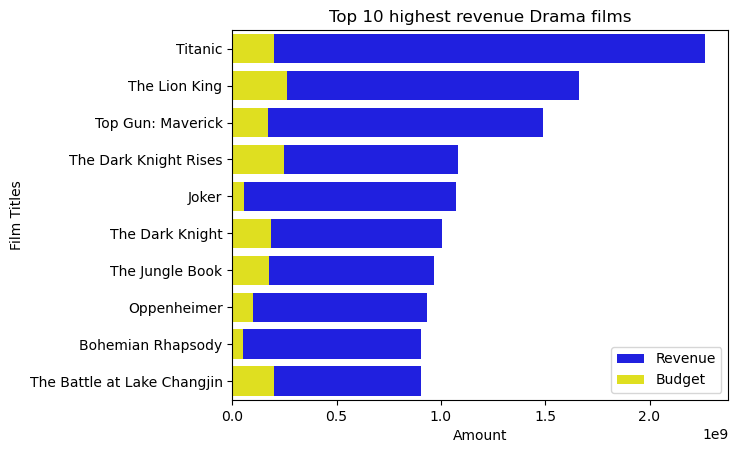

In [90]:
# Looking at top 10 highest revenue collected films in drama genre
temp=df2[df2["Drama"]==True][["title","budget","revenue"]].sort_values("revenue",ascending=False).iloc[:10,:]

temp

# Horizontal Bar plot for top 10 highest revenue collected drama films
sns.barplot(x='revenue', y='title', data=temp, color='blue', label='Revenue')
sns.barplot(x='budget', y='title', data=temp, color='yellow', label='Budget')
plt.title("Top 10 highest revenue Drama films")
plt.xlabel("Amount")
plt.ylabel("Film Titles")
plt.legend()
plt.show()

The above bar plot is drawn to look at the top 10 highest revenue grossers in drama genre. We also wanted to look at the budget spent for these films. To plot this, we have chosen drama genre and sorted the films in descending order based on revenue.

Inference:

From the above bar plot, we can infer that Titanic is the movie with highest revenue collected in drama genre. It has a budget amount close to 200 Million and revenue collected is approximately 2300 Million

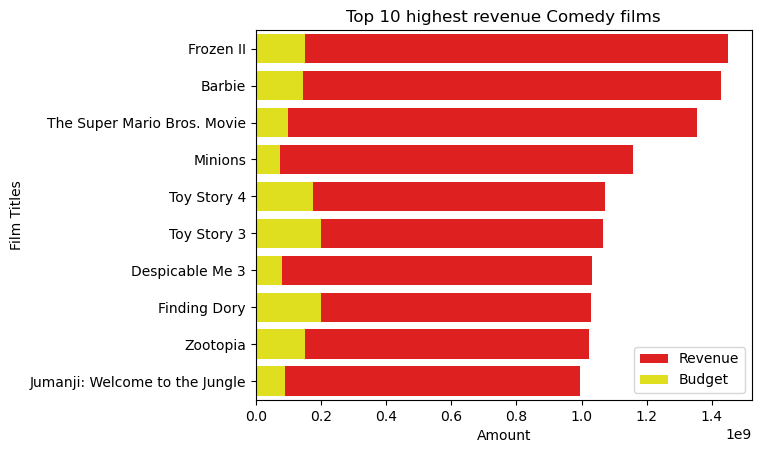

In [91]:
# Looking at top 10 highest revenue collected films in comedy genre
temp=df2[df2["Comedy"]==True][["title","budget","revenue"]].sort_values("revenue",ascending=False).iloc[:10,:]

temp

# Horizontal Bar plot for top 10 highest revenue collected comedy films
sns.barplot(x='revenue', y='title', data=temp, color='red', label='Revenue')
sns.barplot(x='budget', y='title', data=temp, color='yellow', label='Budget')
plt.title("Top 10 highest revenue Comedy films")
plt.xlabel("Amount")
plt.ylabel("Film Titles")
plt.legend()
plt.show()

The above bar plot is drawn to look at the top 10 highest revenue grossers in comedy genre. We also wanted to look at the budget spent for these films. To plot this, we have chosen comedy genre and sorted the films in descending order based on revenue.

Inference:

From the above bar plot, we can infer that Frozen II is the movie with highest revenue collected in comedy genre. It has a budget amount close to 150 Million and revenue collected is approximately 1450 Million

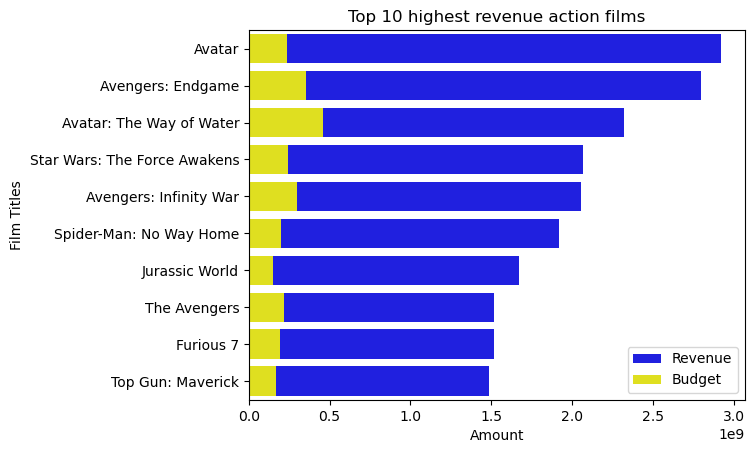

In [92]:
# Looking at top 10 highest budget spent films in action genre
temp=df2[df2["Action"]==True][["title","budget","revenue"]].sort_values("revenue",ascending=False).iloc[:10,:]

temp

# Horizontal Bar plot for top 10 highest revenue collected action films
sns.barplot(x='revenue', y='title', data=temp, color='blue', label='Revenue')
sns.barplot(x='budget', y='title', data=temp, color='yellow', label='Budget')
plt.title("Top 10 highest revenue action films")
plt.xlabel("Amount")
plt.ylabel("Film Titles")
plt.legend()
plt.show()

The above bar plot is drawn to look at the top 10 highest revenue grossers in action genre. We also wanted to look at the budget spent for these films. To plot this, we have chosen action genre and sorted the films in descending order based on revenue.

Inference:

From the above bar plot, we can infer that Avatar is the movie with highest revenue collected in action genre. It has a budget amount close to 230 Million and revenue collected is approximately 2900 Million.

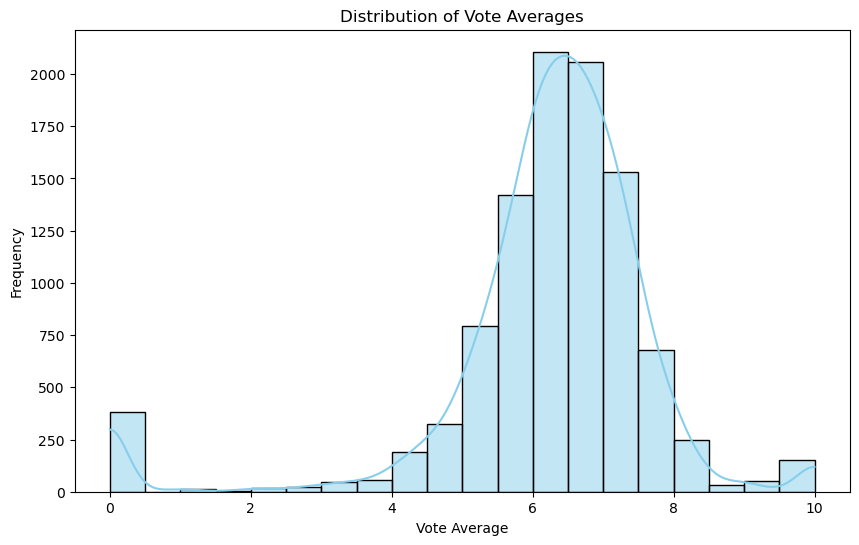

In [93]:
# Histogram plot to look at data distribution for vote averages
plt.figure(figsize=(10, 6))
sns.histplot(df2['vote_average'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of Vote Averages')
plt.xlabel('Vote Average')
plt.ylabel('Frequency')
plt.show()

The above histogram plot is drawn to look at the data distribution of vote averages. To plot this, we have chosen vote average column and plotted it on a histogram.

Inference:

From the above histogram plot, we can infer that the histogram follows approximately normal distribution resembling a bell curve with a mean of approximately 6.2.

In [94]:
df2["original_language"].value_counts().reset_index()

,original_language,count
0,English,7788
1,Hindi,325
2,French,284
3,Russian,213
4,Spanish,177
5,Chinese,136
6,Japanese,115
7,Tamil,103
8,Persian,101
9,Italian,96


In [95]:
df2[df2["original_language"]=="Telugu"]

,title,vote_average,vote_count,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,spoken_languages,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western
3733,RRR,7.811,1068,2022-03-24,160000000,186,False,69000000,Telugu,40.751,"Action, Drama","English, Telugu",True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
5089,Bāhubali: The Beginning,7.554,696,2015-07-10,90747520,158,False,25130430,Telugu,20.925,"Action, Adventure, Drama, Fantasy","Sanskrit, Telugu",True,True,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False
5379,Bāhubali 2: The Conclusion,7.394,642,2017-04-27,275947313,168,False,31000000,Telugu,21.083,"Action, Adventure, Fantasy",Telugu,True,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
12855,Eega,7.037,174,2012-07-05,19450000,145,False,5990000,Telugu,7.433,"Fantasy, Action, Comedy",Telugu,True,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
20250,Arjun Reddy,7.300,84,2017-08-25,8000000,187,False,780000,Telugu,8.369,"Romance, Drama, Action",Telugu,True,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False
21844,The Ghazi Attack,7.000,74,2017-02-17,4300000,126,False,1900000,Telugu,9.683,"Action, War, Thriller, History",Telugu,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,True,False
22071,Saaho,6.041,73,2019-08-29,55000000,171,False,51000000,Telugu,7.418,"Action, Thriller",Telugu,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
23334,Ala Vaikunthapurramuloo,6.800,67,2020-01-12,28859072,165,False,14000000,Telugu,8.167,"Action, Comedy, Drama","Hindi, Telugu",True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
31989,Mahanati,7.525,40,2018-05-09,11589600,176,False,4346100,Telugu,4.764,Drama,Telugu,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
36901,Sarrainodu,6.547,32,2016-04-08,19059053,161,False,7503564,Telugu,5.326,"Action, Drama",Telugu,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False


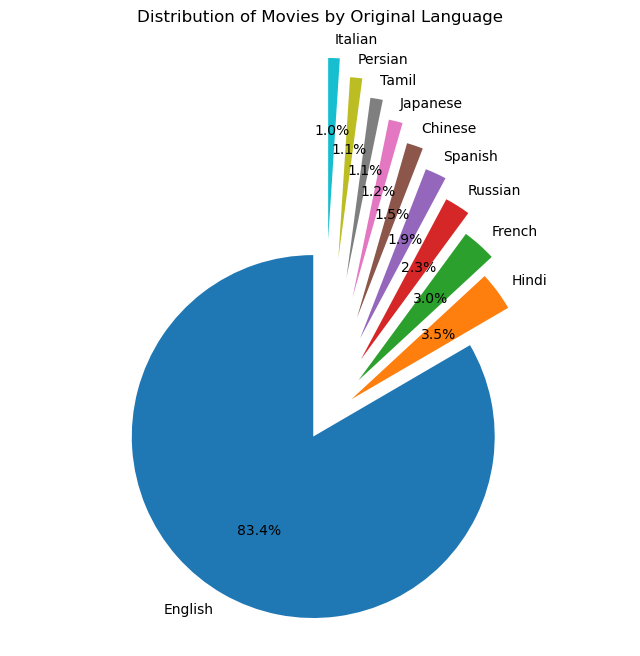

In [96]:
# Looking at top 10 languages with highest number of movies released
temp=df2["original_language"].value_counts().reset_index().iloc[0:10,:]

temp

top5lang=temp["original_language"][:5]

# Pie chart for looking at percentage share of top 10 languages with highest number of movies in each language
exp = (0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1)
plt.figure(figsize=(8, 8))
plt.pie(temp["count"], labels=temp["original_language"], autopct='%1.1f%%', startangle=90,explode=exp)
plt.title('Distribution of Movies by Original Language')
plt.axis('equal')
plt.xticks(rotation=90)
plt.show()


The above pie chart is drawn to look at the percentage share of the top 10 languages with highest movies released in overall. To plot this, we have took the aggregate of movie counts across each language and then sorted it in descending order.

Inference:

From the above pie chart, we can infer that English language movies are largely watched all over the world followed by Hindi and French.

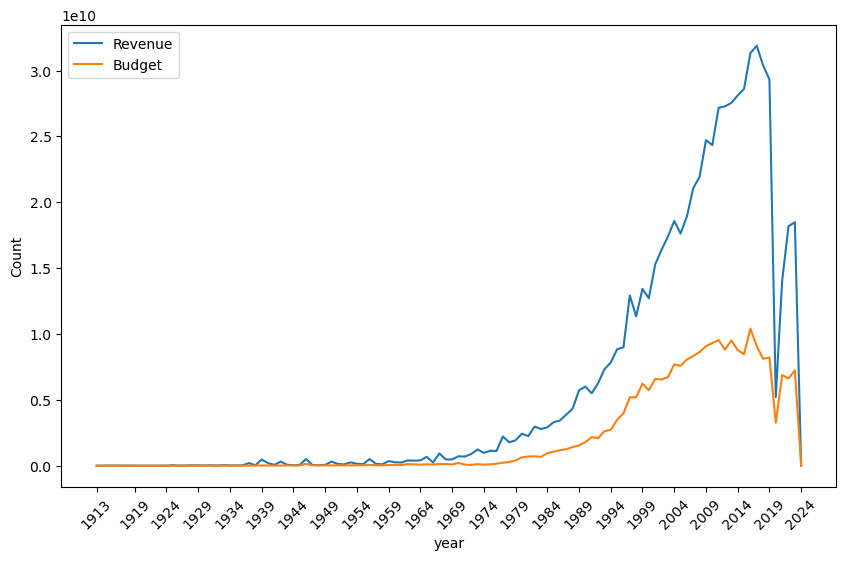

In [97]:
# Creating a new year column from "release_date" column
df2['year'] = pd.to_datetime(df2["release_date"]).dt.year

# Aggregating revenue and budget at year level
temp=df2.groupby("year")[["revenue","budget"]].sum().reset_index()

temp.head()

# Line plot to look at budget spent and revenue collected over the years
plt.figure(figsize=(10,6))
sns.lineplot(x=temp["year"] , y= temp["revenue"],label='Revenue')
sns.lineplot(x=temp["year"] , y= temp["budget"],label='Budget')
years = temp["year"]
plt.xticks(years[::5], years[::5], rotation=45)
plt.ylabel("Count")
plt.show()

The above line plot is drawn to look at the revenue and budget trends over the years. For this, we have chosen budget and revenue columns and plotted their values against years.

Inference:

From the above line trend, we can see highest peaks for budget spent and revenue collected during 2009 to 2019. In the very initial years i.e., 1913 to 1974, when there was no technological advancement in movie industry, there is very little budget spent and revenue collected.

In [98]:
# Looking at movie counts across different languages in each year
df2[["year","original_language"]].value_counts().reset_index().sort_values("count",ascending=False).head()

,year,original_language,count
0,2018,English,245
1,2016,English,241
2,2007,English,238
3,2011,English,238
4,2006,English,237


Text(0.5, 1.0, 'Distribution of top 5 language movies over past 10 years')

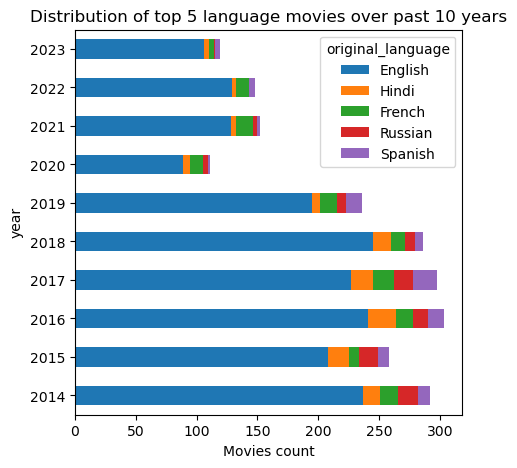

In [99]:
temp=df2[['year','original_language']].pivot_table(index='year', columns='original_language',values = 'original_language',aggfunc='size')

temp.head()

temp=temp.replace(np.nan,0)

temp.head(10)

temp=temp.iloc[100:-1,:]

temp=temp[top5lang]

# Looking at movie counts distribution for recent 10 years across the top 5 languages with highest movies relased
temp

# Stacked horizontal bar chart for looking at Distribution of top 5 language movies over past 10 years
temp.plot(kind='barh',figsize=(5,5),stacked=True)
plt.xlabel("Movies count")
plt.title("Distribution of top 5 language movies over past 10 years")

The above stacked bar chart is drawn to look at the distribution of top 5 language movies over past 10 years. For this, we have looked at movie counts across different languages in each year and sorted them descending based on number of movies released.

Inference:

From the above stacked bar chart, we can infer that in the past 10 years, 2016 year has highest number of movies released and 2020 with least number of movies released. In every year, we can infer that english language movies were majorly released.

Text(0.5, 1.0, 'Correlation Matrix')

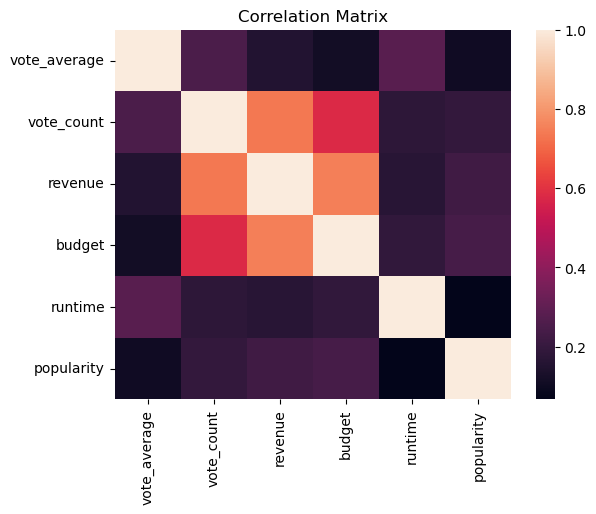

In [100]:
# Heat map for vote average, vote counts, revenue, budget, runtime, and popularity columns
sns.heatmap(df2[["vote_average","vote_count","revenue","budget","runtime","popularity"]].corr())
plt.title("Correlation Matrix")

The above heat map or correlation matrix is drawn to look at the correlation among vote average, vote counts, revenue, budget, runtime, and popularity score.

Inference:
    
From the above heat map, we can infer that revenue and vote counts, budget and revenue are highly correlated.

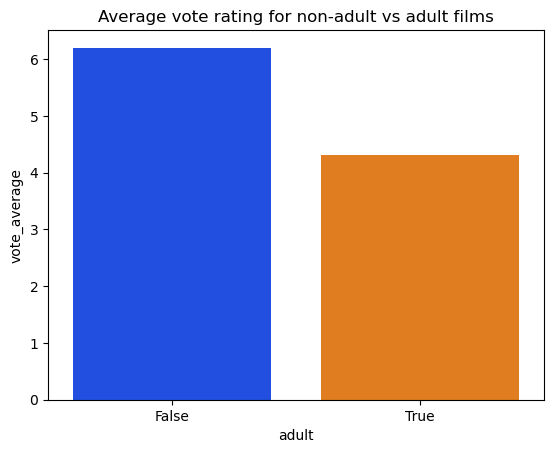

In [101]:
# Mean vote average value by adult characteristic
temp=df2.groupby("adult")["vote_average"].mean().reset_index()

temp

# Bar plot for average vote rating by non-adult v/s adult movies
sns.barplot(x=temp["adult"],y=temp["vote_average"],palette="bright")
plt.title("Average vote rating for non-adult vs adult films")
plt.show()

The above bar plot is drawn to look at the vote average received for a movie across non-adult movies and adult movies. To plot this, we have calculated the metric, mean vote average values for adult and non-adult movies.

Inference:

From the above bar plot, we can infer that the vote average received for any non- adult movie approximately 6.2 and for adult movies it is aorund 4.3.

In [102]:
df2[["runtime","vote_average"]].head()

,runtime,vote_average
0,148,8.364
1,169,8.417
2,152,8.512
3,162,7.573
4,143,7.710


In [103]:
df2["runtime"].describe()

count    10121.000000
mean       107.522972
std         26.574437
min          1.000000
25%         93.000000
50%        104.000000
75%        120.000000
max        300.000000
Name: runtime, dtype: float64

In [104]:
# Looking at runtimes with less than 50 minutes
df2[df2["runtime"]<50].shape

(209, 32)

In [105]:
df2[(df2["runtime"]<100)&(df2["runtime"]>=50)].shape

(3775, 32)

In [106]:
df2[(df2["runtime"]<120)&(df2["runtime"]>=100)].shape

(3523, 32)

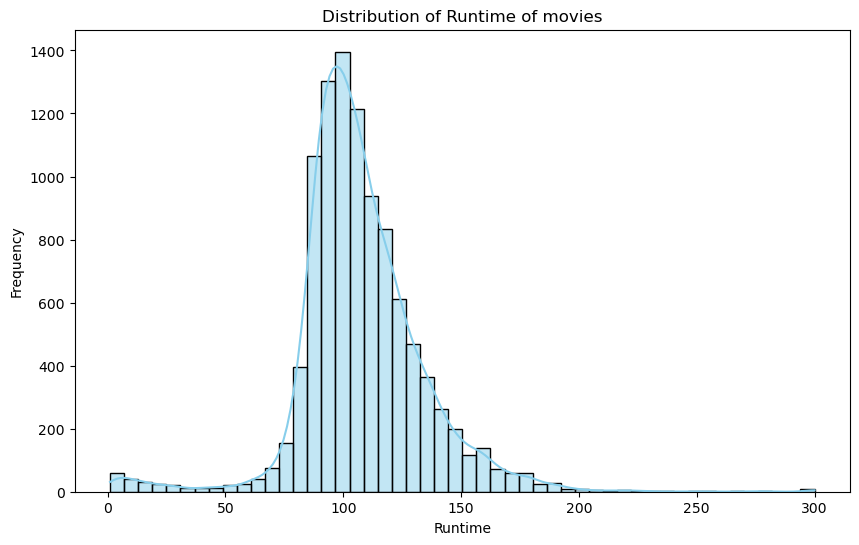

In [107]:
# Histogram plot for runtime
plt.figure(figsize=(10, 6))
sns.histplot(df2['runtime'],bins=50, kde=True, color='skyblue')
plt.title('Distribution of Runtime of movies')
plt.xlabel('Runtime')
plt.ylabel('Frequency')
plt.show()

The above histogram plot is drawn to look at the data distribution of runtimes. To plot this, we have chosen runtime column and plotted it on a histogram.

Inference:

From the above histogram plot, we can infer that the histogram follows approximately normal distribution resembling a bell curve with a runtime mean of approximately 108 minutes.

In [108]:
# Creating bins for categorizing runtimes
bins=[0,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200,301]

In [109]:
labels = ["0 to 50","50 to 60","60 to 70","70 to 80","80 to 90","90 to 100","100 to 110","110 to 120","120 to 130","130 to 140","140 to 150","150 to 160","160 to 170","170 to 180","180 to 190","190 to 200","200 to 300"]

In [110]:
df2['runtimecat'] = pd.cut(df2['runtime'], bins=bins, labels=labels, right=False)

In [111]:
# Calculating Mean vote average value across each runtime category
temp=df2.groupby("runtimecat")["vote_average"].mean().reset_index()

In [112]:
temp

,runtimecat,vote_average
0,0 to 50,3.600392
1,50 to 60,4.590394
2,60 to 70,5.017953
3,70 to 80,5.708819
4,80 to 90,5.780513
5,90 to 100,5.947503
6,100 to 110,6.273953
7,110 to 120,6.505483
8,120 to 130,6.635359
9,130 to 140,6.754584


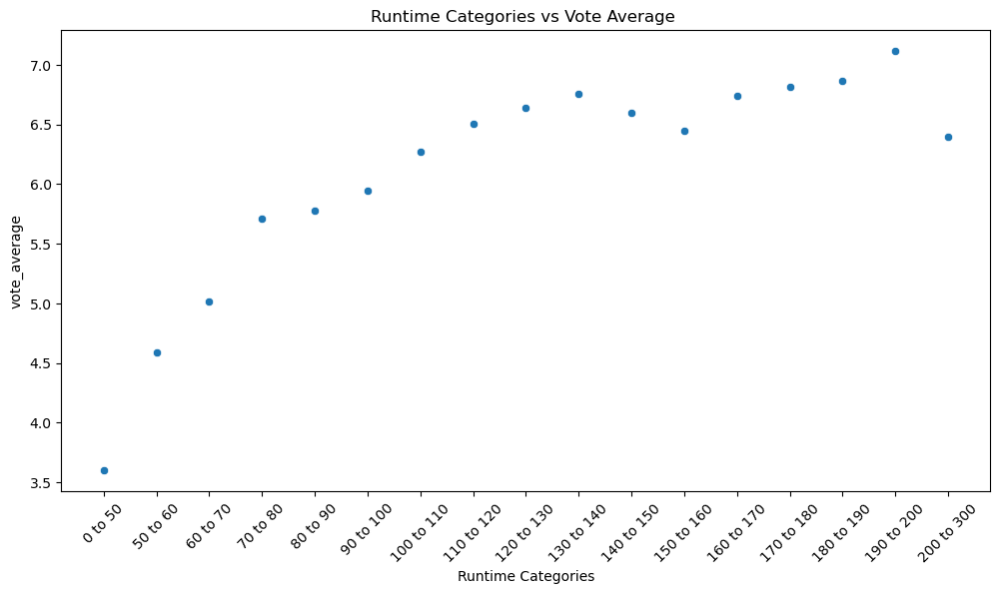

In [113]:
# Scatter Plot for runtime categories v/s vote average
plt.figure(figsize=(12, 6))
sns.scatterplot(x=temp["runtimecat"],y=temp["vote_average"])
plt.xticks(rotation=45)
plt.xlabel("Runtime Categories")
plt.title("Runtime Categories vs Vote Average ")
plt.show()

The above scatter plot is drawn to look at the variation of vote average values w.r.t runtime categories. For this, we have calculated mean vote average value across each runtime category and plotted it.

Inference:

From the above scatter plot, we can infer that as the runtime of movie increases, the mean vote average value increases till 190 to 200 minutes but decreases after 200 to 300 minutes,indicating that users tend to like and rate movies with longer runtimes (ideal being 190 to 200 minutes) but not too long.

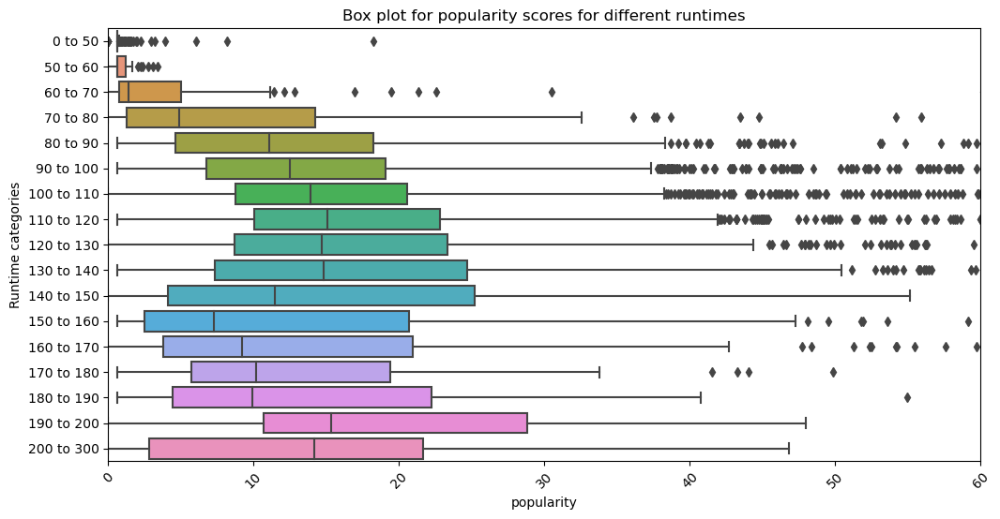

In [114]:
# Box plot of runtime categories vs popularity score
plt.figure(figsize=(12, 6))
sns.boxplot(y=df2["runtimecat"],x=df2["popularity"])
plt.xlim(0,60)
plt.xticks(rotation=45)
plt.title("Box plot for popularity scores for different runtimes")
plt.ylabel("Runtime categories")
plt.show()

The above box plot is drawn to look at the data distribution of poularity score across different runtimes. For this, we have took popularity score data and box plotted it across different runtimes.

Inference:

From the above box plot, we can observe the data distribution of popularity score across different runtimes. We can infer that there are more movies with higher popularity scores in the runtimes ranging from 70 to 140 minutes. Almost across all runtime categories, we can infer that there are more data points concentrated with popularity scores ranging from 5 to 30.

In [115]:
df2[["budget","revenue","vote_average"]].head()

,budget,revenue,vote_average
0,160000000,825532764,8.364
1,165000000,701729206,8.417
2,185000000,1004558444,8.512
3,237000000,2923706026,7.573
4,220000000,1518815515,7.710


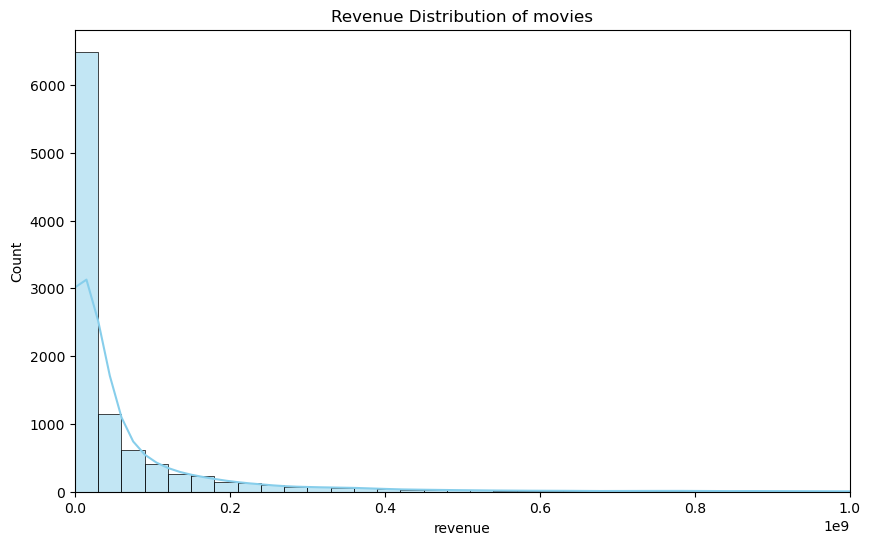

In [116]:
# Histogram plot for revenue
plt.figure(figsize=(10, 6))
sns.histplot(df2['revenue'],bins=100, kde=True, color='skyblue')
plt.title('Revenue Distribution of movies')
plt.xlim(0,1000000000)
plt.show()

The above histogram plot is drawn to observe data distribution of revenue. For this, we chose revenue column and plotted a histogram.

Inference:

From the above plot, we can infer that revenue follows a geometric data distribution.

In [117]:
df2["release_date"].head()

0   2010-07-15
1   2014-11-05
2   2008-07-16
3   2009-12-15
4   2012-04-25
Name: release_date, dtype: datetime64[ns]

In [118]:
df2["month"]=pd.to_datetime(df2["release_date"]).dt.month

In [119]:
df2[["budget","revenue","vote_average","year","month"]].head()

,budget,revenue,vote_average,year,month
0,160000000,825532764,8.364,2010,7
1,165000000,701729206,8.417,2014,11
2,185000000,1004558444,8.512,2008,7
3,237000000,2923706026,7.573,2009,12
4,220000000,1518815515,7.710,2012,4


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


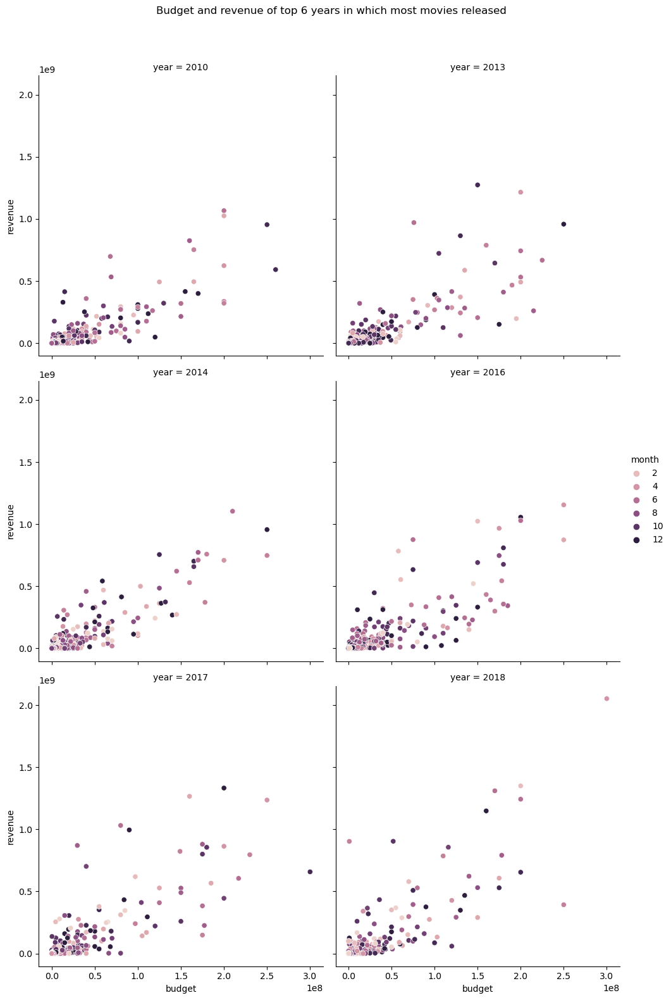

In [120]:
# Looking at the top 6 years with highest number of mvies released
top6years=np.array(df2["year"].value_counts().reset_index().sort_values("count",ascending=False).iloc[:6,0])

top6years

temp=df2[df2["year"].isin(top6years)]

temp[["budget","revenue","vote_average","year","month"]].head()

# Relational Plot for revenue v/s budget across each month for the top 6 years with highest movies released
sns.relplot(data=temp, x="budget", y="revenue", hue="month", col="year", col_wrap=2)
plt.suptitle("Budget and revenue of top 6 years in which most movies released", y=1.05)
plt.show()

The above relational plot is drawn for the top 6 years, month-wise, with highest number of movies released for revenue and budget columns. To plot this, we aggregated movie counts from highest to lowest and identified top 6 years with highest number of movies released. Then we plotted revenue and budget columns month-wise to see the distribution of data points.

Inference:

From the above relational plot, we can infer that almost in all the top 6 years with highest number of movies released (month-wise), there are more number of films concentraed more on low revenue and low budget and with vey few scattered towards high revenue and high budget.

In [121]:
df2.head()

,title,vote_average,vote_count,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,spoken_languages,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western,year,runtimecat,month
0,Inception,8.364,34495,2010-07-15,825532764,148,False,160000000,English,83.952,"Action, Science Fiction, Adventure","English, French, Japanese, Swahili",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,2010,140 to 150,7
1,Interstellar,8.417,32571,2014-11-05,701729206,169,False,165000000,English,140.241,"Adventure, Drama, Science Fiction",English,False,True,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,2014,160 to 170,11
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,False,185000000,English,130.643,"Drama, Action, Crime, Thriller","English, Mandarin",True,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False,2008,150 to 160,7
3,Avatar,7.573,29815,2009-12-15,2923706026,162,False,237000000,English,79.932,"Action, Adventure, Fantasy, Science Fiction","English, Spanish",True,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,2009,160 to 170,12
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,False,220000000,English,98.082,"Science Fiction, Action, Adventure","English, Hindi, Russian",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,2012,140 to 150,4


In [122]:
arr=df2.describe().columns.values

In [123]:
temp=df2[arr]

In [124]:
temp=temp.drop("release_date",axis=1)

In [125]:
temp.columns

Index(['vote_average', 'vote_count', 'revenue', 'runtime', 'budget',
       'popularity', 'year', 'month'],
      dtype='object')

In [126]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [127]:
temp1=temp[["revenue","budget","runtime"]]

In [ ]:
import plotly.express as px

sil=[]
wcss=[]

for i in range(2,10):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(temp1)
    labels = kmeans.labels_
    temp1["k"+str(i)]=labels
    #print(temp1.head())
    #print("k"+str(i))
    fig = px.scatter_3d(temp1,x="revenue", y="budget", z="runtime", color="k"+str(i))
    
    silhouette_avg = silhouette_score(temp1, labels)
    sil.append(silhouette_avg)
    
    wcss.append(kmeans.inertia_)
    #print(silhouette_avg)

    fig.update_layout(
    title=' Clusters',
    scene=dict(
        camera=dict(
            eye=dict(x=1, y=1, z=1)
            )
        )
    )

    fig.show()

In [129]:
sil

[0.8609784084794212,
 0.7845659855766297,
 0.7673719811398899,
 0.7104247148895554,
 0.6935649530806491,
 0.6381698379699625,
 0.6165693533196691,
 0.5607089941437123]

In [130]:
max(sil)

0.8609784084794212

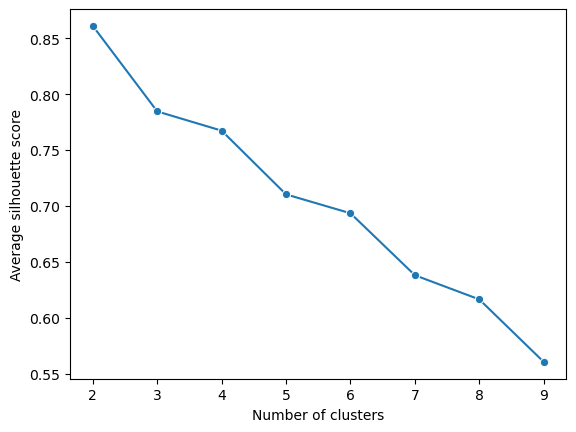

In [131]:
sns.lineplot(x=range(2,10),y=sil,marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Average silhouette score")
plt.show()

In [132]:
wcss

[1.0647768236259443e+20,
 5.891535315180641e+19,
 3.966304550328849e+19,
 2.635332731948639e+19,
 2.0463867512226054e+19,
 1.6193681238316601e+19,
 1.37786903617303e+19,
 1.2253510745711796e+19]

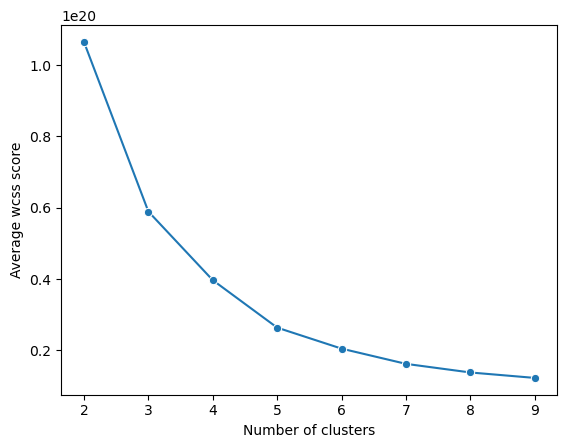

In [133]:
sns.lineplot(x=range(2,10),y=wcss,marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Average wcss score")
plt.show()

In [134]:
temp.columns

Index(['vote_average', 'vote_count', 'revenue', 'runtime', 'budget',
       'popularity', 'year', 'month'],
      dtype='object')

In [135]:
temp2=temp[["vote_average","vote_count","popularity"]]

In [136]:
temp2.head()

,vote_average,vote_count,popularity
0,8.364,34495,83.952
1,8.417,32571,140.241
2,8.512,30619,130.643
3,7.573,29815,79.932
4,7.710,29166,98.082


In [137]:
sil=[]
wcss=[]
for i in range(2,10):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(temp2)
    labels = kmeans.labels_
    temp2["k"+str(i)]=labels
    #print(temp2.head())
    print("k"+str(i))
    fig = px.scatter_3d(temp2,x="vote_average", y="vote_count", z="popularity", color="k"+str(i))
    
    silhouette_avg = silhouette_score(temp2, labels)
    sil.append(silhouette_avg)
    wcss.append(kmeans.inertia_)

    fig.update_layout(
    title=' Clusters',
    scene=dict(
        camera=dict(
            eye=dict(x=1, y=1, z=1)
            )
        )
    )

    fig.show()

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/var/folders/06/8vjrr4qd1xvfqkstfft274h00000gn/T/ipykernel_36316/1590687170.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



k2


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/var/folders/06/8vjrr4qd1xvfqkstfft274h00000gn/T/ipykernel_36316/1590687170.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



k3


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/var/folders/06/8vjrr4qd1xvfqkstfft274h00000gn/T/ipykernel_36316/1590687170.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



k4


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/var/folders/06/8vjrr4qd1xvfqkstfft274h00000gn/T/ipykernel_36316/1590687170.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



k5


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



k6


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



k7


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



k8


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



k9


In [138]:
max(sil)

0.8350864274809007

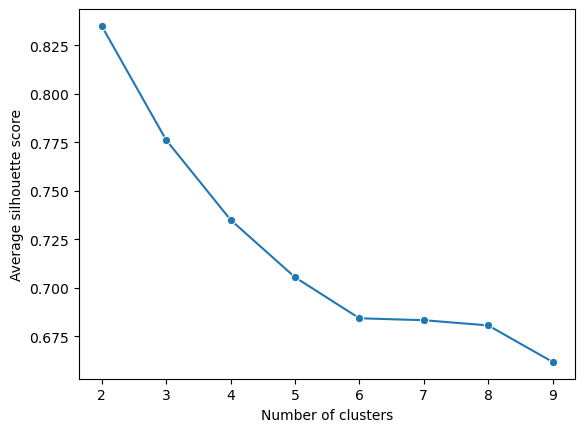

In [139]:
sns.lineplot(x=range(2,10),y=sil,marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Average silhouette score")
plt.show()

In [140]:
wcss

[29965799653.688717,
 14295692919.042784,
 8544024356.5134945,
 5598881824.202157,
 4068771673.6316376,
 2889253046.6770973,
 2231363149.026154,
 1777225617.977301]

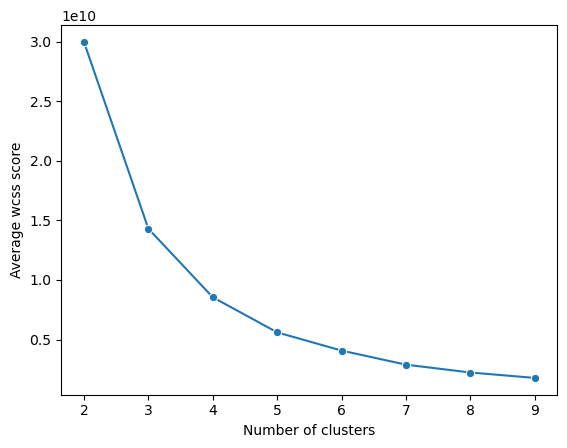

In [141]:
sns.lineplot(x=range(2,10),y=wcss,marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Average wcss score")
plt.show()

In [142]:
temp.head()

,vote_average,vote_count,revenue,runtime,budget,popularity,year,month
0,8.364,34495,825532764,148,160000000,83.952,2010,7
1,8.417,32571,701729206,169,165000000,140.241,2014,11
2,8.512,30619,1004558444,152,185000000,130.643,2008,7
3,7.573,29815,2923706026,162,237000000,79.932,2009,12
4,7.710,29166,1518815515,143,220000000,98.082,2012,4


In [143]:
temp=temp.drop(columns=["year","month"])

In [144]:
temp.to_csv('hclustmovies.csv')

In [145]:
df2.columns

Index(['title', 'vote_average', 'vote_count', 'release_date', 'revenue',
       'runtime', 'adult', 'budget', 'original_language', 'popularity',
       'genres', 'spoken_languages', 'Action', 'Adventure', 'Animation',
       'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy',
       'History', 'Horror', 'Music', 'Mystery', 'Romance', 'Science Fiction',
       'TV Movie', 'Thriller', 'War', 'Western', 'year', 'runtimecat',
       'month'],
      dtype='object')

In [146]:
df3=df2.iloc[:,12:31]

In [147]:
df3.head()

,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western
0,True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
1,False,True,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False
2,True,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False
3,True,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False
4,True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False


In [148]:
df3=df3.replace({True:1,False:0})

In [149]:
df3.head()

,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western
0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
2,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0
3,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
4,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [150]:
df3.to_csv("arm_movies.csv")

In [151]:
df2.head()

,title,vote_average,vote_count,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,spoken_languages,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western,year,runtimecat,month
0,Inception,8.364,34495,2010-07-15,825532764,148,False,160000000,English,83.952,"Action, Science Fiction, Adventure","English, French, Japanese, Swahili",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,2010,140 to 150,7
1,Interstellar,8.417,32571,2014-11-05,701729206,169,False,165000000,English,140.241,"Adventure, Drama, Science Fiction",English,False,True,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,2014,160 to 170,11
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,False,185000000,English,130.643,"Drama, Action, Crime, Thriller","English, Mandarin",True,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False,2008,150 to 160,7
3,Avatar,7.573,29815,2009-12-15,2923706026,162,False,237000000,English,79.932,"Action, Adventure, Fantasy, Science Fiction","English, Spanish",True,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,2009,160 to 170,12
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,False,220000000,English,98.082,"Science Fiction, Action, Adventure","English, Hindi, Russian",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,2012,140 to 150,4


In [ ]:
df2["genres"]

In [153]:
df4.columns

Index(['id', 'title', 'vote_average', 'vote_count', 'status', 'release_date',
       'revenue', 'runtime', 'adult', 'backdrop_path', 'budget', 'homepage',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'tagline', 'genres',
       'production_companies', 'production_countries', 'spoken_languages'],
      dtype='object')

In [154]:
df2.columns

Index(['title', 'vote_average', 'vote_count', 'release_date', 'revenue',
       'runtime', 'adult', 'budget', 'original_language', 'popularity',
       'genres', 'spoken_languages', 'Action', 'Adventure', 'Animation',
       'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy',
       'History', 'Horror', 'Music', 'Mystery', 'Romance', 'Science Fiction',
       'TV Movie', 'Thriller', 'War', 'Western', 'year', 'runtimecat',
       'month'],
      dtype='object')

In [155]:
df4["overview"].head()[0]

'Cobb, a skilled thief who commits corporate espionage by infiltrating the subconscious of his targets is offered a chance to regain his old life as payment for a task considered to be impossible: "inception", the implantation of another person\'s idea into a target\'s subconscious.'

In [156]:
df4.head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,budget,homepage,imdb_id,original_language,original_title,overview,popularity,poster_path,tagline,genres,production_companies,production_countries,spoken_languages
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,160000000,https://www.warnerbros.com/movies/inception,tt1375666,en,Inception,"Cobb, a skilled thief who commits corporate es...",83.952,/oYuLEt3zVCKq57qu2F8dT7NIa6f.jpg,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili"
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,165000000,http://www.interstellarmovie.net/,tt0816692,en,Interstellar,The adventures of a group of explorers who mak...,140.241,/gEU2QniE6E77NI6lCU6MxlNBvIx.jpg,Mankind was born on Earth. It was never meant ...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English
2,155,The Dark Knight,8.512,30619,Released,2008-07-16,1004558444,152,False,/nMKdUUepR0i5zn0y1T4CsSB5chy.jpg,185000000,https://www.warnerbros.com/movies/dark-knight/,tt0468569,en,The Dark Knight,Batman raises the stakes in his war on crime. ...,130.643,/qJ2tW6WMUDux911r6m7haRef0WH.jpg,Welcome to a world without rules.,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin"
3,19995,Avatar,7.573,29815,Released,2009-12-15,2923706026,162,False,/vL5LR6WdxWPjLPFRLe133jXWsh5.jpg,237000000,https://www.avatar.com/movies/avatar,tt0499549,en,Avatar,"In the 22nd century, a paraplegic Marine is di...",79.932,/kyeqWdyUXW608qlYkRqosgbbJyK.jpg,Enter the world of Pandora.,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish"
4,24428,The Avengers,7.710,29166,Released,2012-04-25,1518815515,143,False,/9BBTo63ANSmhC4e6r62OJFuK2GL.jpg,220000000,https://www.marvel.com/movies/the-avengers,tt0848228,en,The Avengers,When an unexpected enemy emerges and threatens...,98.082,/RYMX2wcKCBAr24UyPD7xwmjaTn.jpg,Some assembly required.,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian"


In [157]:
len(df2.columns)

34

In [158]:
len(df2)

10121

In [159]:
df2["Action"].value_counts()[1]

2456

In [160]:
a={}
for i in df2.columns[12:31]:
    
    a[i]=df2[i].value_counts()[1]


In [161]:
print(a)

{'Action': 2456, 'Adventure': 1612, 'Animation': 569, 'Comedy': 3544, 'Crime': 1479, 'Documentary': 214, 'Drama': 4764, 'Family': 1006, 'Fantasy': 905, 'History': 511, 'Horror': 1108, 'Music': 411, 'Mystery': 807, 'Romance': 1896, 'Science Fiction': 974, 'TV Movie': 25, 'Thriller': 2362, 'War': 368, 'Western': 165}


In [162]:
a = sorted(a.items(), key=lambda x: x[1], reverse=True)

In [163]:
a

[('Drama', 4764),
 ('Comedy', 3544),
 ('Action', 2456),
 ('Thriller', 2362),
 ('Romance', 1896),
 ('Adventure', 1612),
 ('Crime', 1479),
 ('Horror', 1108),
 ('Family', 1006),
 ('Science Fiction', 974),
 ('Fantasy', 905),
 ('Mystery', 807),
 ('Animation', 569),
 ('History', 511),
 ('Music', 411),
 ('War', 368),
 ('Documentary', 214),
 ('Western', 165),
 ('TV Movie', 25)]

In [164]:
temp=df2[["Drama","Comedy","Action","Thriller","Romance"]].value_counts().reset_index()

In [165]:
temp[~temp.iloc[:, :-1].any(axis=1)]

,Drama,Comedy,Action,Thriller,Romance,count
2,False,False,False,False,False,909


In [166]:
df2.shape

(10121, 34)

In [167]:
df2[["Drama","Comedy","Action","Thriller","Romance"]].head()

,Drama,Comedy,Action,Thriller,Romance
0,False,False,True,False,False
1,True,False,False,False,False
2,True,False,True,True,False
3,False,False,True,False,False
4,False,False,True,False,False


In [168]:
df5=df2[df2[["Drama", "Comedy", "Action", "Thriller", "Romance"]].any(axis=1)]

In [169]:
df5.head()

,title,vote_average,vote_count,release_date,revenue,runtime,adult,budget,original_language,popularity,genres,spoken_languages,Action,Adventure,Animation,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Mystery,Romance,Science Fiction,TV Movie,Thriller,War,Western,year,runtimecat,month
0,Inception,8.364,34495,2010-07-15,825532764,148,False,160000000,English,83.952,"Action, Science Fiction, Adventure","English, French, Japanese, Swahili",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,2010,140 to 150,7
1,Interstellar,8.417,32571,2014-11-05,701729206,169,False,165000000,English,140.241,"Adventure, Drama, Science Fiction",English,False,True,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,2014,160 to 170,11
2,The Dark Knight,8.512,30619,2008-07-16,1004558444,152,False,185000000,English,130.643,"Drama, Action, Crime, Thriller","English, Mandarin",True,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False,2008,150 to 160,7
3,Avatar,7.573,29815,2009-12-15,2923706026,162,False,237000000,English,79.932,"Action, Adventure, Fantasy, Science Fiction","English, Spanish",True,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,2009,160 to 170,12
4,The Avengers,7.710,29166,2012-04-25,1518815515,143,False,220000000,English,98.082,"Science Fiction, Action, Adventure","English, Hindi, Russian",True,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,2012,140 to 150,4


In [170]:
df5=df5.drop(columns=["title","release_date","runtime","original_language","genres","spoken_languages","Adventure","Animation","Crime","Documentary","Family","Fantasy","History","Horror","Music","Mystery","Science Fiction","TV Movie","War","Western","year","month"])

In [171]:
temp=df5["runtimecat"]

In [172]:
df5.drop(columns=["runtimecat"],inplace=True)

In [173]:
df5.insert(6,"runtimecat",temp)

In [174]:
df5.head()

,vote_average,vote_count,revenue,adult,budget,popularity,runtimecat,Action,Comedy,Drama,Romance,Thriller
0,8.364,34495,825532764,False,160000000,83.952,140 to 150,True,False,False,False,False
1,8.417,32571,701729206,False,165000000,140.241,160 to 170,False,False,True,False,False
2,8.512,30619,1004558444,False,185000000,130.643,150 to 160,True,False,True,False,True
3,7.573,29815,2923706026,False,237000000,79.932,160 to 170,True,False,False,False,False
4,7.710,29166,1518815515,False,220000000,98.082,140 to 150,True,False,False,False,False


In [175]:
temp=df5["adult"]

In [176]:
df5.drop(columns=["adult"],inplace=True)

In [177]:
df5.insert(6,"adult",temp)

In [178]:
from sklearn.preprocessing import MinMaxScaler ,LabelEncoder

In [179]:
scaler = MinMaxScaler()

In [180]:
colnames=df5.columns[:5]

In [181]:
colnames

Index(['vote_average', 'vote_count', 'revenue', 'budget', 'popularity'], dtype='object')

In [182]:
temp=pd.DataFrame(scaler.fit_transform(df5.iloc[:,:5]),columns=colnames)

In [183]:
df5.drop(columns=colnames,inplace=True)

In [184]:
temp_reset = temp.reset_index(drop=True)
df5_reset = df5.reset_index(drop=True)


df5 = pd.concat([temp_reset, df5_reset], axis=1)

In [185]:
df5.shape

(9212, 12)

In [186]:
df5.head()

,vote_average,vote_count,revenue,budget,popularity,runtimecat,adult,Action,Comedy,Drama,Romance,Thriller
0,0.8364,1.000000,0.282358,0.347825,0.028037,140 to 150,False,True,False,False,False,False
1,0.8417,0.944224,0.240013,0.358694,0.046835,160 to 170,False,False,False,True,False,False
2,0.8512,0.887636,0.343591,0.402173,0.043630,150 to 160,False,True,False,True,False,True
3,0.7573,0.864328,1.000000,0.515216,0.026694,160 to 170,False,True,False,False,False,False
4,0.7710,0.845514,0.519483,0.478260,0.032756,140 to 150,False,True,False,False,False,False


In [187]:
df5["runtimecat"].value_counts()

runtimecat
90 to 100     2117
100 to 110    1942
110 to 120    1381
120 to 130     961
80 to 90       925
130 to 140     621
140 to 150     343
150 to 160     229
70 to 80       160
160 to 170     136
0 to 50        128
170 to 180      90
180 to 190      55
60 to 70        52
200 to 300      31
190 to 200      22
50 to 60        19
Name: count, dtype: int64

In [188]:
colnames=df5.columns[5:]

In [189]:
colnames

Index(['runtimecat', 'adult', 'Action', 'Comedy', 'Drama', 'Romance',
       'Thriller'],
      dtype='object')

In [190]:
df5.head()

,vote_average,vote_count,revenue,budget,popularity,runtimecat,adult,Action,Comedy,Drama,Romance,Thriller
0,0.8364,1.000000,0.282358,0.347825,0.028037,140 to 150,False,True,False,False,False,False
1,0.8417,0.944224,0.240013,0.358694,0.046835,160 to 170,False,False,False,True,False,False
2,0.8512,0.887636,0.343591,0.402173,0.043630,150 to 160,False,True,False,True,False,True
3,0.7573,0.864328,1.000000,0.515216,0.026694,160 to 170,False,True,False,False,False,False
4,0.7710,0.845514,0.519483,0.478260,0.032756,140 to 150,False,True,False,False,False,False


In [191]:
for i in colnames:
    encoder= LabelEncoder()
    temp=df5[i]
    df5.drop(columns=[i],inplace=True)
    df5[i]=encoder.fit_transform(temp)

In [192]:
df5.head()

,vote_average,vote_count,revenue,budget,popularity,runtimecat,adult,Action,Comedy,Drama,Romance,Thriller
0,0.8364,1.000000,0.282358,0.347825,0.028037,5,0,1,0,0,0,0
1,0.8417,0.944224,0.240013,0.358694,0.046835,7,0,0,0,1,0,0
2,0.8512,0.887636,0.343591,0.402173,0.043630,6,0,1,0,1,0,1
3,0.7573,0.864328,1.000000,0.515216,0.026694,7,0,1,0,0,0,0
4,0.7710,0.845514,0.519483,0.478260,0.032756,5,0,1,0,0,0,0


In [193]:
df5.shape

(9212, 12)

In [194]:
from sklearn.model_selection  import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from scipy.spatial import distance
from sklearn.metrics import classification_report , confusion_matrix

In [195]:
def accuracys(a,b):
    count=0
    for i in range(len(a)):
        x= " ".join(a.iloc[i,:].tolist())
        y= " ".join(b.iloc[i,:].tolist())
        
        if(x==y):
            count=count+1
    return count/len(a)

In [196]:
def accuracys2(a,b):
    count=0
    
    
    for i in range(len(a)):
        x= " ".join(a.iloc[i,:].tolist())
        y= " ".join(b.iloc[i,:].tolist())
        
        hamming_distance = distance.hamming(list(x), list(y)) * len(x)
        
        count+=(len(x.split(" "))-hamming_distance)/len(x.split(" "))
        
        
    return count/len(a)

In [197]:
def setparams_dec(i,j,k,l):
    
    params = {
    'max_depth': i,
    'min_samples_split': j,
    'min_samples_leaf': k,
    'ccp_alpha': l
    }
    
    return params

In [198]:
def split(x,y):
    
    #np.random.seed(10)

    x_train, x_dev_test, y_train, y_dev_test = train_test_split(x, y, test_size=0.2 )#, random_state=10)

    x_dev, x_test, y_dev, y_test = train_test_split(x_dev_test,y_dev_test, test_size=0.5 )#,random_state=10 )
    
    return x_train,x_dev, x_test, y_train , y_dev , y_test

In [199]:
def dec(x_train, x_dev , y_train , y_dev ,params,test=False,tree=False):
    
    
    y_dev_actual= pd.DataFrame()
    y_dev_pred = pd.DataFrame()
    


    for i in y_train.columns:
        
        #x_train,x_dev, x_test, y_train , y_dev , y_test = split(x,y[i])
    

        #print(x_train.shape ,x_dev.shape,x_test.shape)

        clf = DecisionTreeClassifier(**params)

        clf.fit(x_train, y_train[i])
        

        y_pred = clf.predict(x_dev)

        accuracy = accuracy_score(y_dev[i], y_pred)
        #print("Accuracy for development on ",i,"column", accuracy)
        #print()
    
        y_dev_pred[i]= y_pred
        y_dev_actual[i]= y_dev[i]
        y_dev_pred[i]=y_dev_pred[i].astype("str")
        y_dev_actual[i]=y_dev_actual[i].astype("str")
        
        
        #print("For column",i)
        
        #print(cm)
        
        if (test):
            cm=confusion_matrix(y_dev_actual[i],y_dev_pred[i])
            plt.figure(figsize=(5, 4))
            sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
            plt.xlabel('Predicted labels')
            plt.ylabel('True labels')
        
            plt.title('Confusion Matrix for column '+i)
            plt.show()
            
        if (tree):
            plt.figure(figsize=(50,45))
            plt.title(str(i) ,fontsize=40)
            plot_tree(clf, filled=True,  feature_names= list(x_train.columns.values))
            plt.show()
    
    #print("Combined accuracy for all genres",accuracys(y_dev_actual,y_dev_pred))
    #print("Combined accuracy using hamming loss for all genres",accuracys2(y_dev_actual,y_dev_pred))
    
    return accuracys2(y_dev_actual,y_dev_pred)

In [200]:
def hyper_p_tuning_dec(x_train, x_dev, y_train , y_dev ,params):
    
    
    best_params={
    "max_depth":0,
    "min_samples_split":0,
    "min_samples_leaf":0,
    "ccp_alpha":0,
    
    }
    
    acc_hyper={}

    best_acc=0
    count=0
    
    for i in params["max_depth"]:
        for j in params["min_samples_split"]:
            for k in params["min_samples_leaf"]:
                for l in params["ccp_alpha"]:
                
                    prms=setparams_dec(i,j,k,l)
                    
                    #print("For hyperparameters",prms)
                    
                
                    acc=dec(x_train, x_dev, y_train , y_dev ,prms)
                    
                    
                    #print(str(i)+" "+str(j)+" "+str(k)+" "+str(l))
                    
                    acc_hyper[str(i)+" "+str(j)+" "+str(k)+" "+str(l)]=acc
                    
                    
                
                    if(acc>best_acc):
                        best_acc=acc
                        best_params["max_depth"]=i
                        best_params["min_samples_split"]=j
                        best_params["min_samples_leaf"]=k
                        best_params["ccp_alpha"]=l
                    #print(i,j,k,l,acc)
    #print(len(acc_hyper.keys()))
    plt.figure(figsize=(25,10))
    plt.xticks(rotation=90)
    sns.lineplot(x=acc_hyper.keys(),y=acc_hyper.values())
    plt.xlabel("Hyper Parameters set")
    plt.ylabel("Accuracy")
    plt.show()
    
    
    return best_params , best_acc

In [201]:
params={
    'max_depth': [None, 3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'ccp_alpha': [0.0, 0.1, 0.2]
}

In [202]:
x_train, x_dev, x_test, y_train , y_dev , y_test = split(df5.iloc[:,:7],df5.iloc[:,7:])

In [203]:
x_train.head()

,vote_average,vote_count,revenue,budget,popularity,runtimecat,adult
3417,0.5565,0.024351,0.006703,0.163042,0.004570,1,0
7122,0.6964,0.001594,0.000032,0.000958,0.000935,16,0
5557,0.5862,0.006610,0.004225,0.013041,0.003735,5,0
609,0.7162,0.168488,0.029072,0.008693,0.012931,15,0
4307,0.5700,0.014379,0.000045,0.043476,0.004525,16,0


In [204]:
x_train.head()

,vote_average,vote_count,revenue,budget,popularity,runtimecat,adult
3417,0.5565,0.024351,0.006703,0.163042,0.004570,1,0
7122,0.6964,0.001594,0.000032,0.000958,0.000935,16,0
5557,0.5862,0.006610,0.004225,0.013041,0.003735,5,0
609,0.7162,0.168488,0.029072,0.008693,0.012931,15,0
4307,0.5700,0.014379,0.000045,0.043476,0.004525,16,0


In [205]:
x_dev.head()

,vote_average,vote_count,revenue,budget,popularity,runtimecat,adult
6935,0.5530,0.001913,0.000003,0.002172,0.001375,14,0
4435,0.6268,0.013364,0.012433,0.054346,0.004360,1,0
2047,0.6424,0.051950,0.022459,0.119563,0.006134,1,0
7969,0.4500,0.000406,0.000109,0.005433,0.000885,1,0
6065,0.5864,0.004377,0.000731,0.021737,0.003567,1,0


In [206]:
x_test.head()

,vote_average,vote_count,revenue,budget,popularity,runtimecat,adult
1611,0.6673,0.069807,0.010817,0.073911,0.010887,2,0
7027,0.6100,0.001768,0.000022,0.008693,0.001795,14,0
2237,0.7267,0.046413,0.016224,0.178259,0.004181,2,0
1574,0.7404,0.072590,0.034899,0.043476,0.010730,16,0
5256,0.6813,0.007972,0.002463,0.028259,0.003070,2,0


In [207]:
y_train.head()

,Action,Comedy,Drama,Romance,Thriller
3417,0,0,1,0,1
7122,0,1,1,0,0
5557,0,0,1,0,0
609,0,1,0,0,0
4307,1,0,0,0,1


In [208]:
y_dev.head()

,Action,Comedy,Drama,Romance,Thriller
6935,0,0,1,0,1
4435,0,1,0,1,0
2047,1,0,0,0,1
7969,0,1,0,1,0
6065,1,0,1,0,0


In [209]:
y_test.head()

,Action,Comedy,Drama,Romance,Thriller
1611,1,0,0,0,1
7027,0,0,0,1,0
2237,0,1,1,0,0
1574,1,1,0,0,0
5256,0,1,1,0,0


x_train.to_csv('x_train.csv', index=False) 
x_dev.to_csv('x_dev.csv', index=False) 
x_test.to_csv('x_test.csv', index=False) 
y_train.to_csv('y_train.csv', index=False) 
y_dev.to_csv('y_dev.csv', index=False) 
y_test.to_csv('y_test.csv', index=False) 

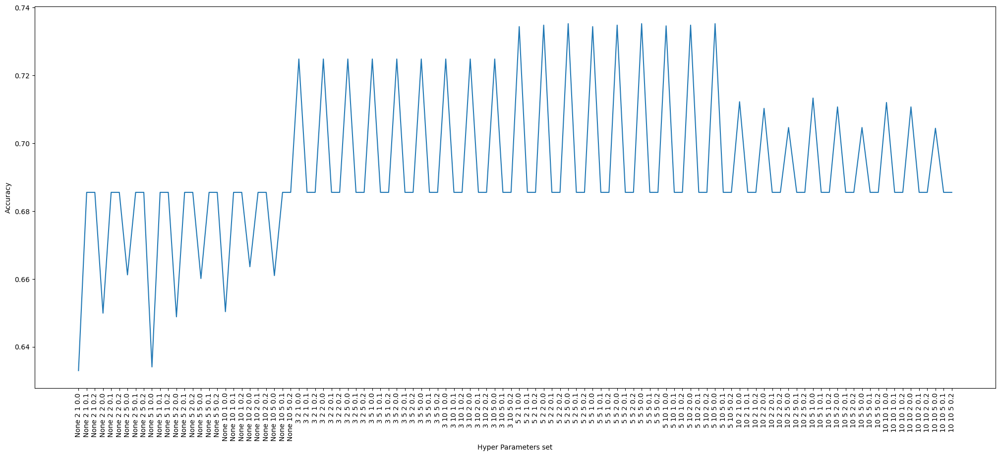

In [210]:
best_params , best_acc = hyper_p_tuning_dec(x_train, x_dev, y_train , y_dev ,params)

In [211]:
print("After Development \n\n","Best Hyper Parameters are ",best_params ,"\n\n", "Best accuracy is ",best_acc)

After Development 

 Best Hyper Parameters are  {'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 5, 'ccp_alpha': 0.0} 

 Best accuracy is  0.7352877307274708


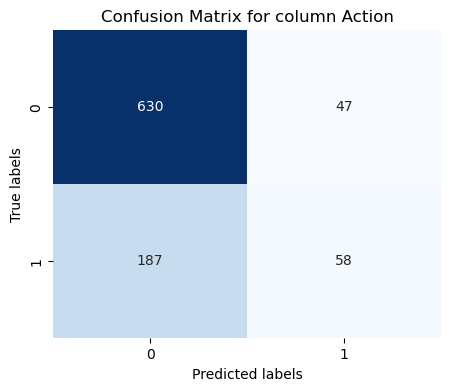

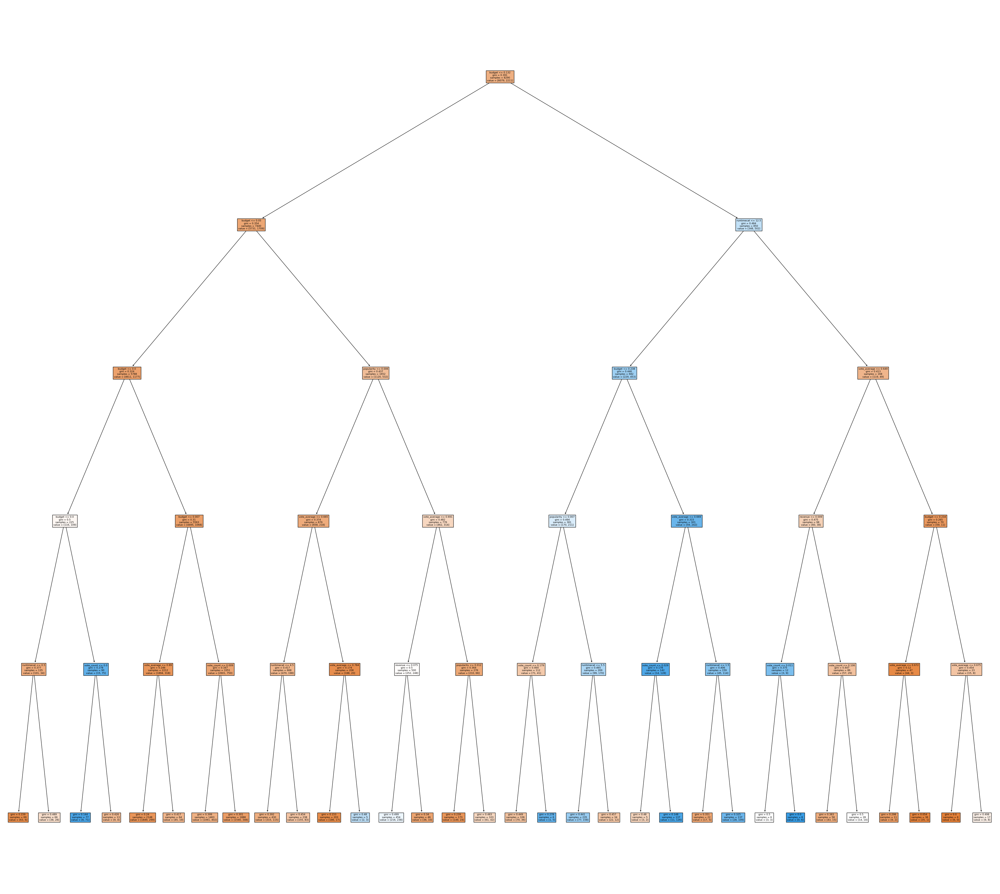

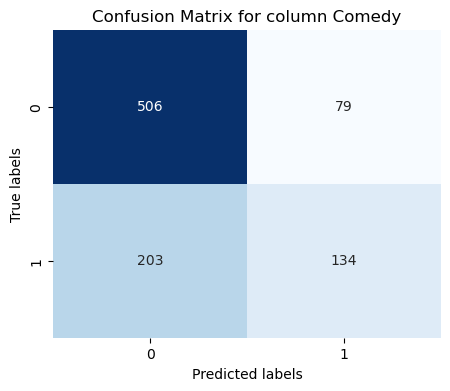

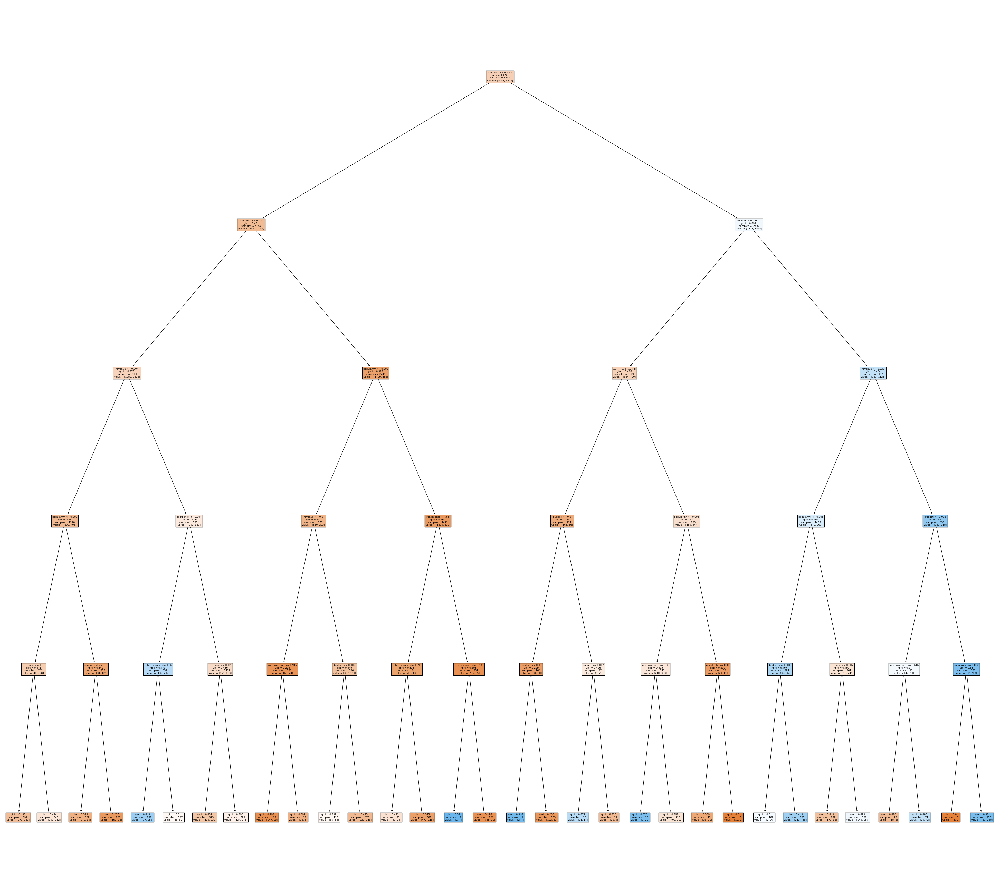

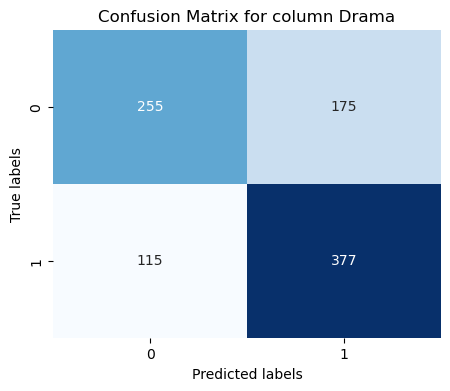

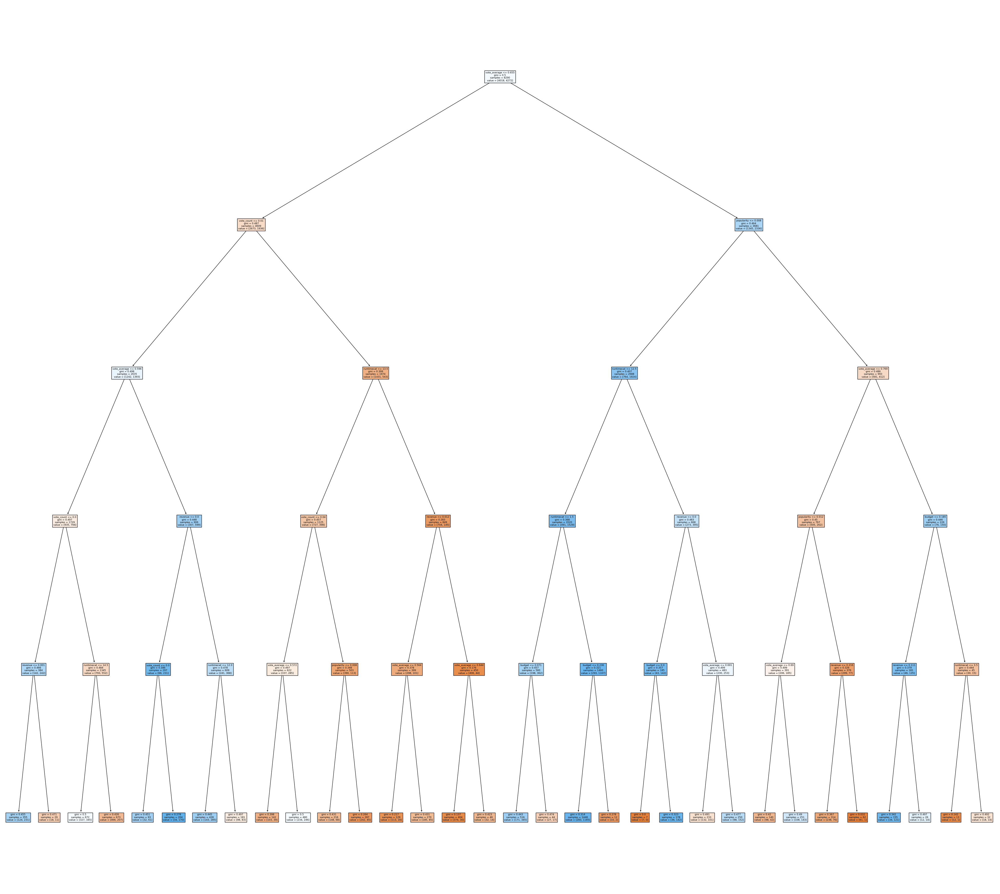

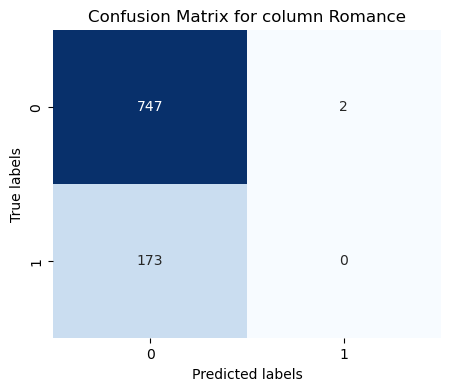

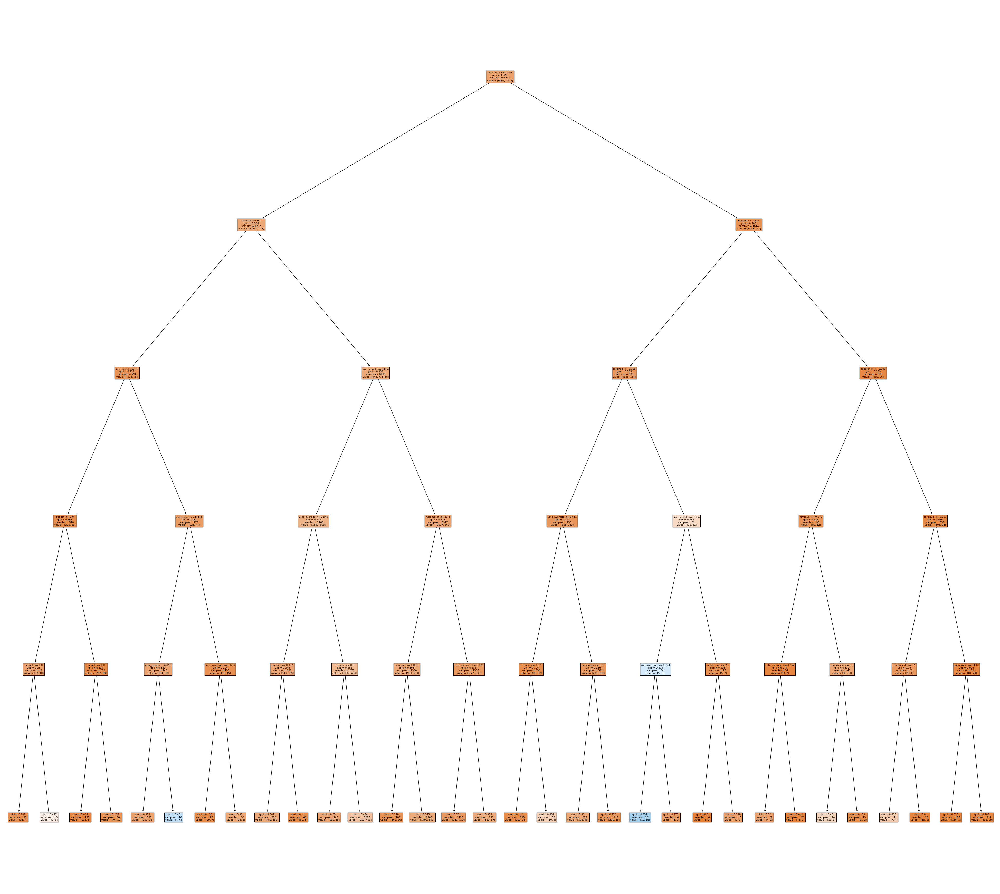

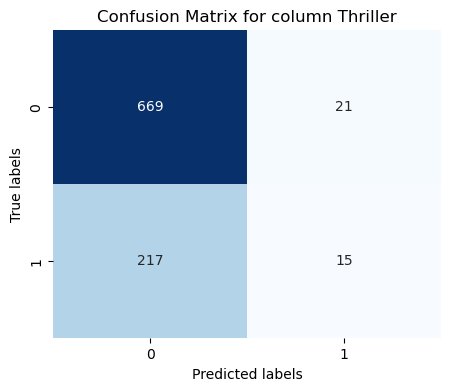

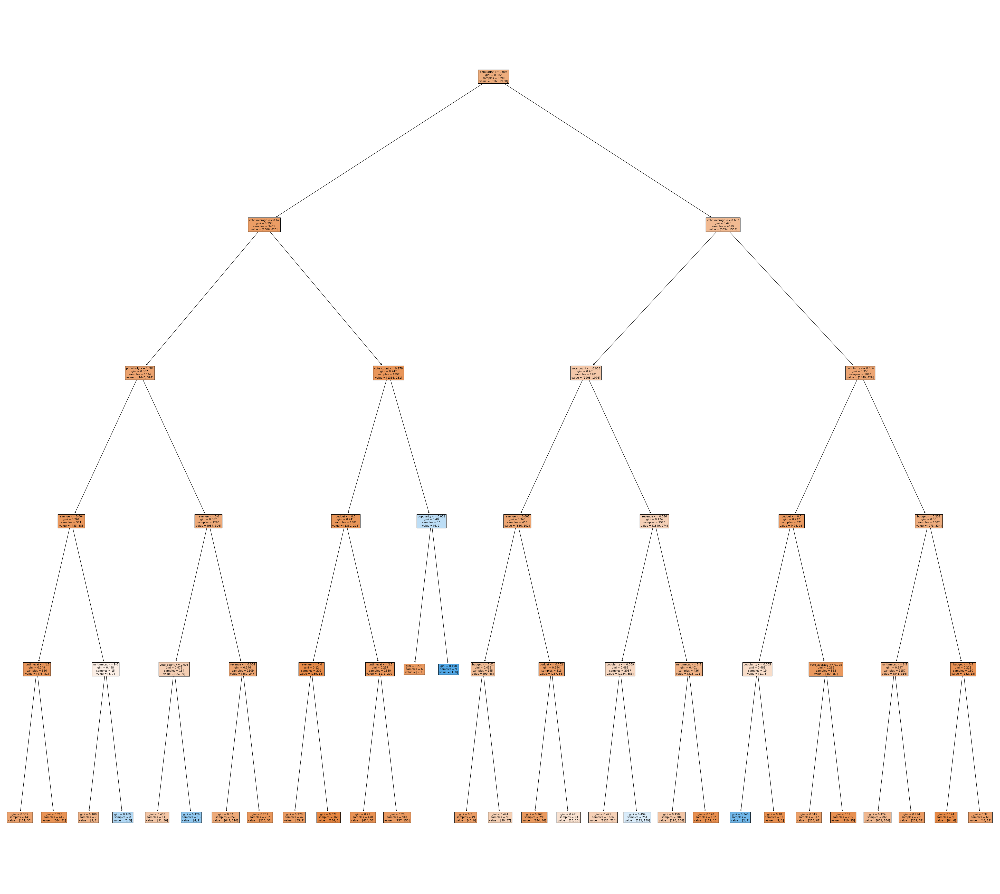

In [212]:
acc=dec(pd.concat([x_train, x_dev]), x_test, pd.concat([y_train , y_dev]) , y_test ,best_params,True,tree=True)

In [213]:
print("Test accuracy ",acc)

Test accuracy  0.7355748373101958


# Naive Bayes

In [214]:
def setparams_nb(i):
    
    params = {
    'var_smoothing': i
    }
    
    return params

In [215]:
def nb(x_train, x_dev , y_train , y_dev ,params,test=False):
    
    
    y_dev_actual= pd.DataFrame()
    y_dev_pred = pd.DataFrame()
    


    for i in y_train.columns:
        
        #x_train,x_dev, x_test, y_train , y_dev , y_test = split(x,y[i])
    

        #print(x_train.shape ,x_dev.shape,x_test.shape)

        clf = GaussianNB(**params)

        clf.fit(x_train, y_train[i])

        y_pred = clf.predict(x_dev)

        accuracy = accuracy_score(y_dev[i], y_pred)
        #print("Accuracy for development on ",i,"column", accuracy)
        #print()
    
        y_dev_pred[i]= y_pred
        y_dev_actual[i]= y_dev[i]
        y_dev_pred[i]=y_dev_pred[i].astype("str")
        y_dev_actual[i]=y_dev_actual[i].astype("str")
    
    #print("Combined accuracy for all genres",accuracys(y_dev_actual,y_dev_pred))
    #print("Combined accuracy using hamming loss for all genres",accuracys2(y_dev_actual,y_dev_pred))
    
        if (test):
            cm=confusion_matrix(y_dev_actual[i],y_dev_pred[i])
            plt.figure(figsize=(5, 4))
            sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
            plt.xlabel('Predicted labels')
            plt.ylabel('True labels')
        
            plt.title('Confusion Matrix for column '+i)
            plt.show()
    
    return accuracys2(y_dev_actual,y_dev_pred)

In [216]:
def hyper_p_tuning_nb(x_train, x_dev, y_train , y_dev ,params):
    
    
    best_params={
    "var_smoothing":0
    }
    
    acc_hyper={}

    best_acc=0
    
    for i in params["var_smoothing"]:
                
        prms=setparams_nb(i)
        
        
                
        acc=nb(x_train, x_dev, y_train , y_dev ,prms)
        
        acc_hyper[str(i)]=acc
                    
                
        if(acc>best_acc):
            best_acc=acc
            best_params["var_smoothing"]=i
            #print(i,acc)
            
    plt.figure(figsize=(25,10))
    plt.xticks(rotation=90)
    sns.lineplot(x=acc_hyper.keys(),y=acc_hyper.values())
    plt.xlabel("Hyper Parameters set")
    plt.ylabel("Accuracy")
    plt.show()
    
    return best_params , best_acc

In [217]:
params = { 
    'var_smoothing': [1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e-0, 1e1,1e2]
}

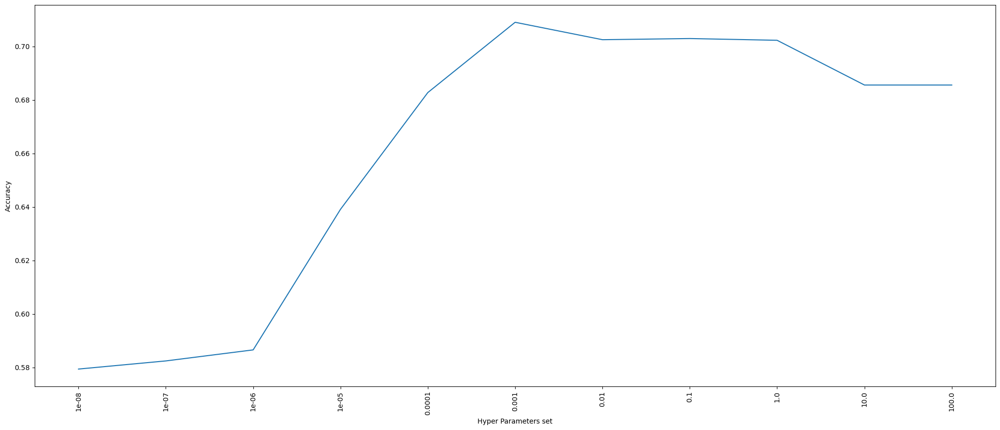

In [218]:
best_params , best_acc = hyper_p_tuning_nb(x_train, x_dev, y_train , y_dev ,params)

In [219]:
print("After Development \n\n","Best Hyper Parameters are ",best_params ,"\n\n", "Best accuracy is ",best_acc)

After Development 

 Best Hyper Parameters are  {'var_smoothing': 0.001} 

 Best accuracy is  0.7090119435396312


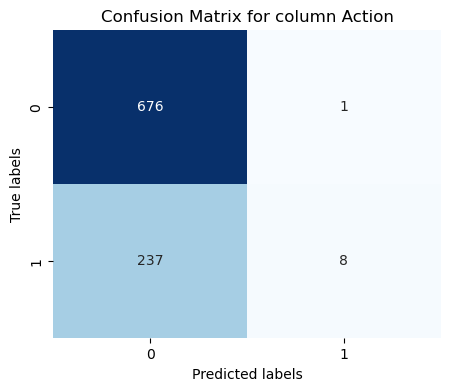

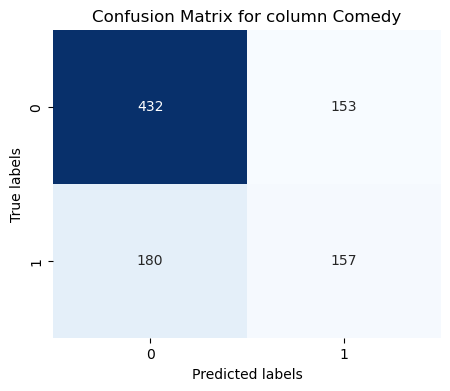

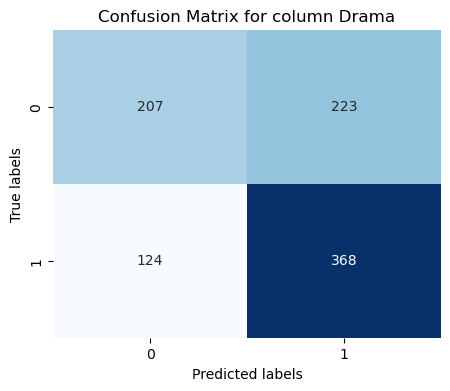

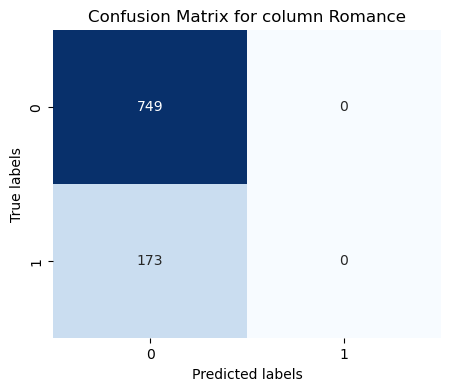

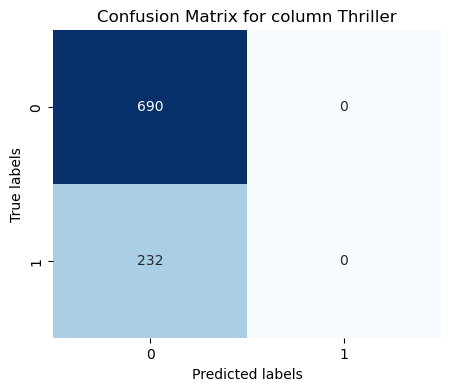

In [220]:
acc=nb(pd.concat([x_train, x_dev]), x_test, pd.concat([y_train , y_dev]) , y_test ,best_params,True)

In [221]:
print("Test accuracy ",acc)

Test accuracy  0.7130151843817802


# SVM

In [222]:
from sklearn.svm import SVC

In [223]:
x_train.head()

,vote_average,vote_count,revenue,budget,popularity,runtimecat,adult
3417,0.5565,0.024351,0.006703,0.163042,0.004570,1,0
7122,0.6964,0.001594,0.000032,0.000958,0.000935,16,0
5557,0.5862,0.006610,0.004225,0.013041,0.003735,5,0
609,0.7162,0.168488,0.029072,0.008693,0.012931,15,0
4307,0.5700,0.014379,0.000045,0.043476,0.004525,16,0


In [224]:
y_train.head()

,Action,Comedy,Drama,Romance,Thriller
3417,0,0,1,0,1
7122,0,1,1,0,0
5557,0,0,1,0,0
609,0,1,0,0,0
4307,1,0,0,0,1


In [225]:
def setparams_svm(i,j):
    
    params = {
    'kernel': i,
        "C":j
    }
    
    return params

In [226]:
def svm(x_train, x_dev , y_train , y_dev ,params,test=False):
    
    
    y_dev_actual= pd.DataFrame()
    y_dev_pred = pd.DataFrame()
    


    for i in y_train.columns:
        
        #x_train,x_dev, x_test, y_train , y_dev , y_test = split(x,y[i])
    

        #print(x_train.shape ,x_dev.shape,x_test.shape)

        clf = SVC(**params)

        clf.fit(x_train, y_train[i])

        y_pred = clf.predict(x_dev)

        accuracy = accuracy_score(y_dev[i], y_pred)
        #print("Accuracy for development on ",i,"column", accuracy)
        #print()
    
        y_dev_pred[i]= y_pred
        y_dev_actual[i]= y_dev[i]
        y_dev_pred[i]=y_dev_pred[i].astype("str")
        y_dev_actual[i]=y_dev_actual[i].astype("str")
    
    #print("Combined accuracy for all genres",accuracys(y_dev_actual,y_dev_pred))
    #print("Combined accuracy using hamming loss for all genres",accuracys2(y_dev_actual,y_dev_pred))
    
        if (test):
            cm=confusion_matrix(y_dev_actual[i],y_dev_pred[i])
            plt.figure(figsize=(5, 4))
            sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
            plt.xlabel('Predicted labels')
            plt.ylabel('True labels')
        
            plt.title('Confusion Matrix for column '+i+' of hyperparameter set '+str(list(params.values())))
            plt.show()
    
    return accuracys2(y_dev_actual,y_dev_pred)

In [227]:
def hyper_p_tuning_svm(x_train, x_dev, y_train , y_dev ,params):
    
    
    best_params={
        "kernel": "0",
        "C":0
    }
    
    acc_hyper={}

    best_acc=0
    
    for i in params["kernel"]:
        for j in params["C"]: 
            
            prms=setparams_svm(i,j)



            acc=svm(x_train, x_dev, y_train , y_dev ,prms,True)

            acc_hyper[str(i)+" "+str(j)]=acc


            if(acc>best_acc):
                best_acc=acc
                best_params["kernel"]=i
                best_params["C"]=j
                #print(i,j,acc)
            
    plt.figure(figsize=(6,4))
    plt.xticks(rotation=90)
    sns.lineplot(x=acc_hyper.keys(),y=acc_hyper.values())
    plt.xlabel("Hyper Parameters set (kernel , C)")
    plt.ylabel("Accuracy")
    plt.show()
    
    return best_params , best_acc

In [228]:
params={
    'kernel': ['linear', 'poly', 'rbf'],
    'C': [0.01, 0.1, 1]
}

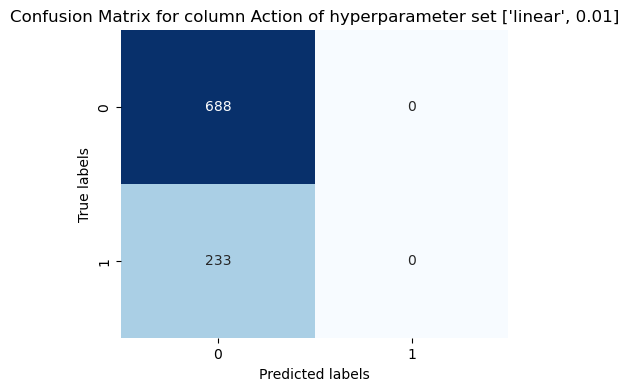

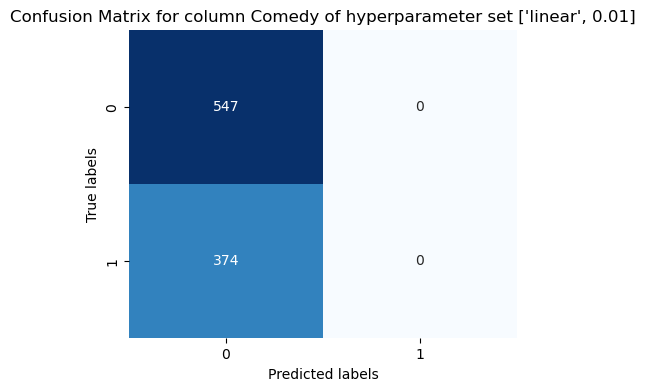

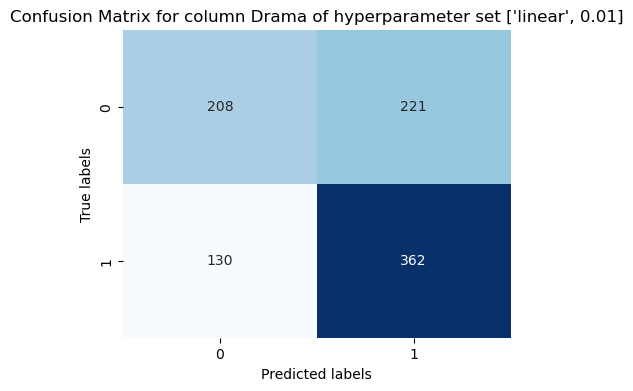

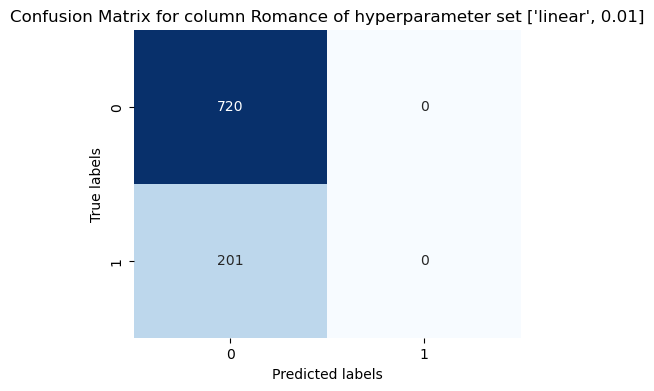

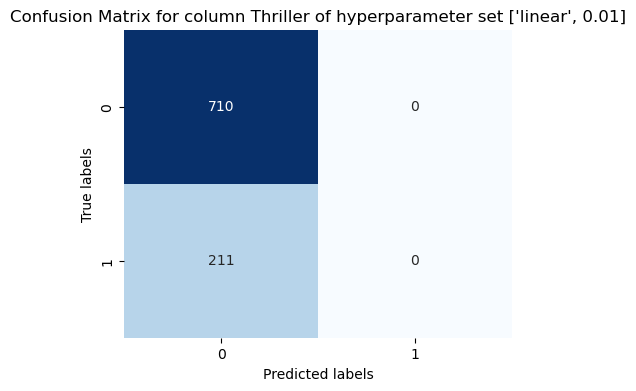

...

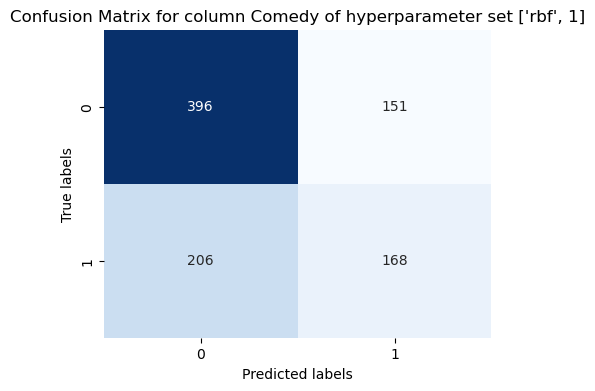

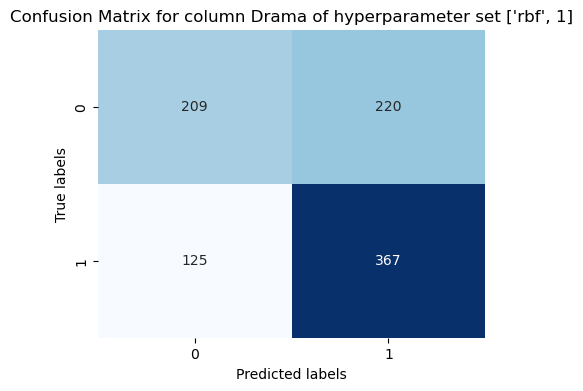

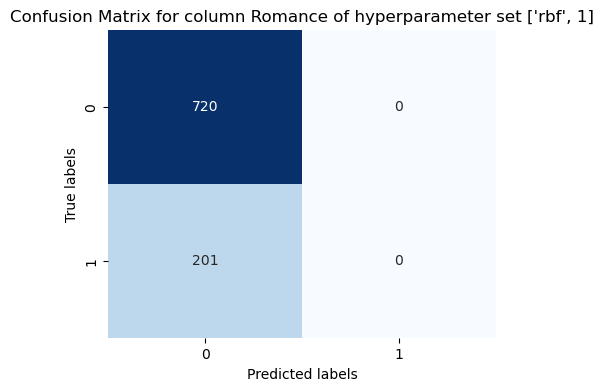

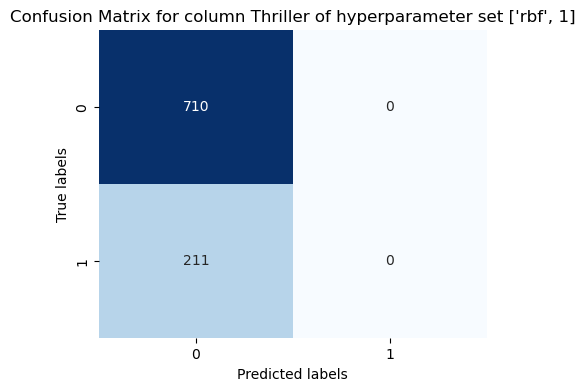

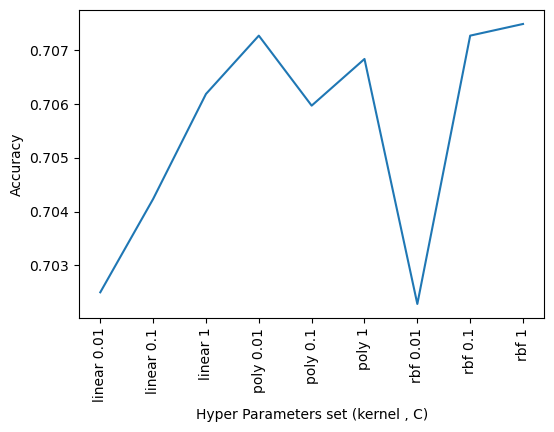

In [229]:
best_params , best_acc = hyper_p_tuning_svm(x_train, x_dev, y_train , y_dev ,params)

In [230]:
print("After Development \n\n","Best Hyper Parameters are ",best_params ,"\n\n", "Best accuracy is ",best_acc)

After Development 

 Best Hyper Parameters are  {'kernel': 'rbf', 'C': 1} 

 Best accuracy is  0.7074918566775247


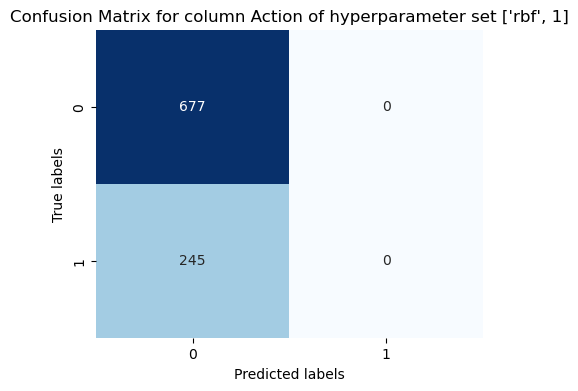

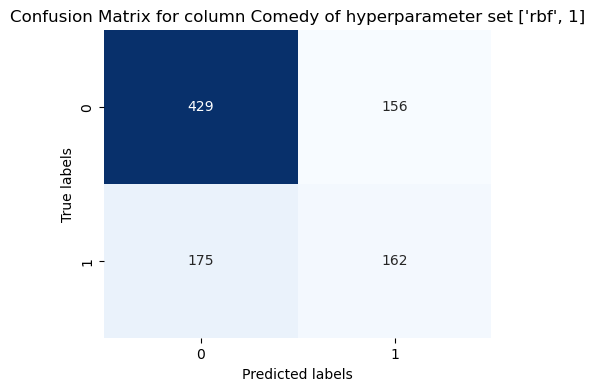

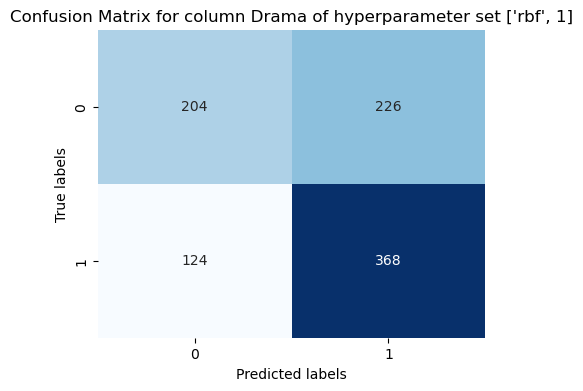

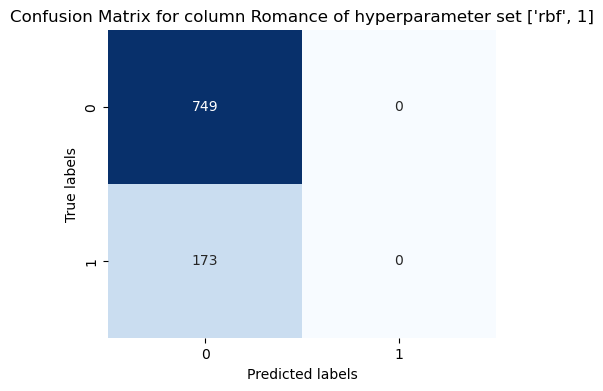

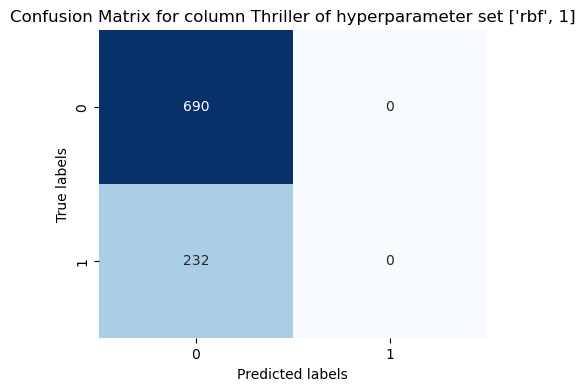

In [231]:
acc=svm(pd.concat([x_train, x_dev]), x_test, pd.concat([y_train , y_dev]) , y_test ,best_params,True)

In [232]:
print("Test accuracy ",acc)

Test accuracy  0.7112798264642096


## L R

In [233]:
from sklearn.linear_model import LogisticRegression

In [234]:
def setparams_lor(i,j):
    
    params = {
        'C': i,
        'penalty': j,
        "solver":"saga"
    }
    
    return params

In [235]:
def lor(x_train, x_dev , y_train , y_dev ,params,test=False):
    
    
    y_dev_actual= pd.DataFrame()
    y_dev_pred = pd.DataFrame()
    


    for i in y_train.columns:
        
        #x_train,x_dev, x_test, y_train , y_dev , y_test = split(x,y[i])
    

        #print(x_train.shape ,x_dev.shape,x_test.shape)

        model = LogisticRegression(**params)

        model.fit(x_train, y_train[i])

        y_pred = model.predict(x_dev)

        accuracy = accuracy_score(y_dev[i], y_pred)
        #print("Accuracy for development on ",i,"column", accuracy)
        #print()
    
        y_dev_pred[i]= y_pred
        y_dev_actual[i]= y_dev[i]
        y_dev_pred[i]=y_dev_pred[i].astype("str")
        y_dev_actual[i]=y_dev_actual[i].astype("str")
    
    #print("Combined accuracy for all genres",accuracys(y_dev_actual,y_dev_pred))
    #print("Combined accuracy using hamming loss for all genres",accuracys2(y_dev_actual,y_dev_pred))
    
        if (test):
            cm=confusion_matrix(y_dev_actual[i],y_dev_pred[i])
            plt.figure(figsize=(5, 4))
            sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
            plt.xlabel('Predicted labels')
            plt.ylabel('True labels')
        
            plt.title('Confusion Matrix for column '+i+' of hyperparameter set '+str(list(params.values())))
            plt.show()
    
    return accuracys2(y_dev_actual,y_dev_pred)

In [236]:
def hyper_p_tuning_lor(x_train, x_dev, y_train , y_dev ,params):
    
    
    best_params={
        'C': 0,
        'penalty': "0"
    }
    
    acc_hyper={}

    best_acc=0
    
    for i in params["C"]:
        for j in params["penalty"]: 
            
            prms=setparams_lor(i,j)



            acc=lor(x_train, x_dev, y_train , y_dev ,prms)

            acc_hyper[str(i)+" "+str(j)]=acc


            if(acc>best_acc):
                best_acc=acc
                best_params["C"]=i
                best_params["penalty"]=j
                best_params["solver"]="saga"
                #print(i,j,acc)
            
    plt.figure(figsize=(6,4))
    plt.xticks(rotation=90)
    sns.lineplot(x=acc_hyper.keys(),y=acc_hyper.values())
    plt.xlabel("Hyper Parameters set (C , penalty )")
    plt.ylabel("Accuracy")
    plt.show()
    
    return best_params , best_acc

In [237]:
params = {
    'C': [0.01, 0.1, 1.0, 10.0],
    'penalty': ['l1', 'l2']
}

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceW

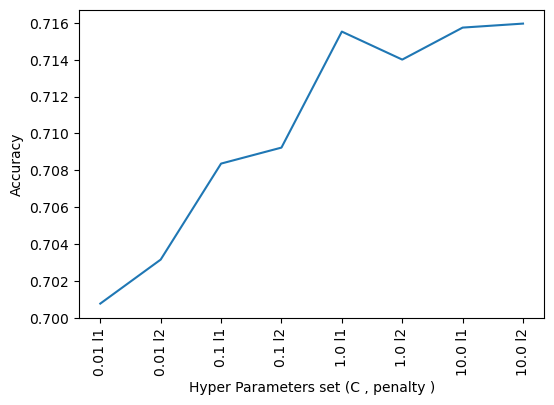

In [238]:
best_params , best_acc = hyper_p_tuning_lor(x_train, x_dev, y_train , y_dev ,params)

In [239]:
print("After Development \n\n","Best Hyper Parameters are ",best_params ,"\n\n", "Best accuracy is ",best_acc)

After Development 

 Best Hyper Parameters are  {'C': 10.0, 'penalty': 'l2', 'solver': 'saga'} 

 Best accuracy is  0.7159609120521182


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



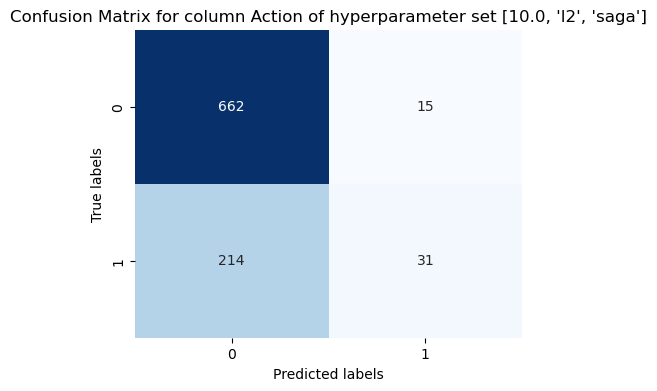

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



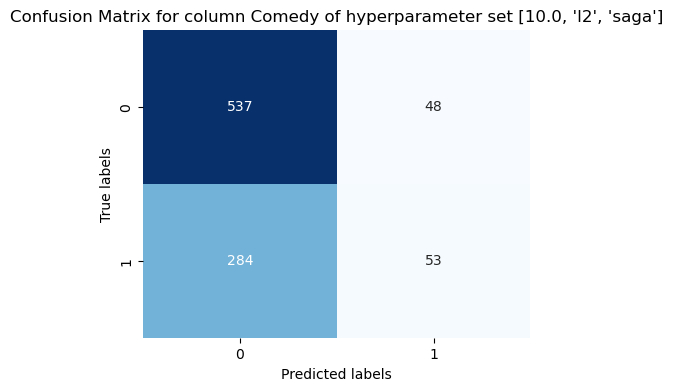

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



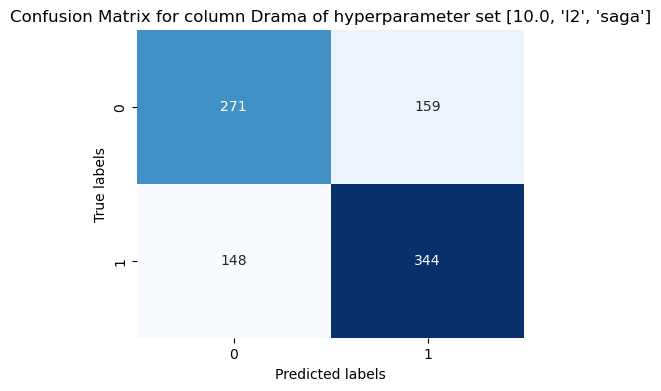

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



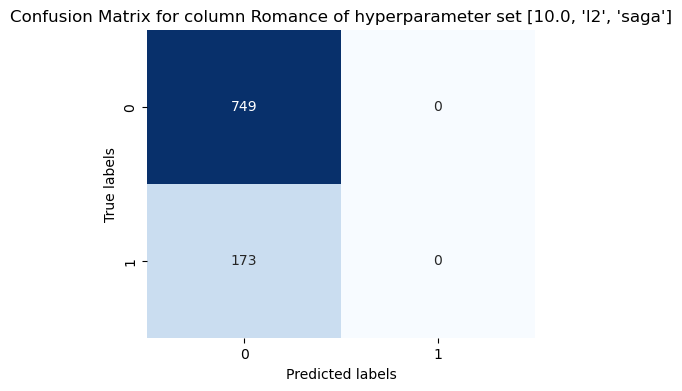

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



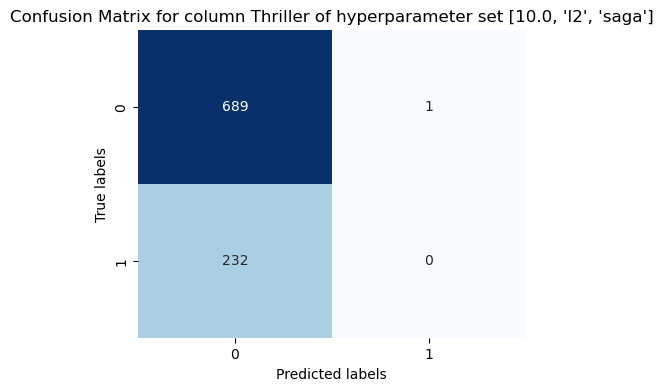

In [240]:
acc=lor(pd.concat([x_train, x_dev]), x_test, pd.concat([y_train , y_dev]) , y_test ,best_params,True)

In [241]:
print("Test accuracy ",acc)

Test accuracy  0.7236442516268989


## FNN

In [242]:
from sklearn.metrics import multilabel_confusion_matrix

In [243]:
x_train.shape , x_test.shape , x_dev.shape , y_dev.shape , y_test.shape , y_train.shape

((7369, 7), (922, 7), (921, 7), (921, 5), (922, 5), (7369, 5))

In [244]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

In [245]:
def setparams_fnn(i,j,k):
    
    params = {
        'learning_rate': i,
        'epochs': j,
        'layers':k
    }
    
    return params

In [246]:
def fnn_model(x_train , y_train ,  params):
     
    layers = params["layers"]
    lr = params["learning_rate"]
    epochs = params["epochs"] 
    
    model = Sequential()
    
    model.add(Dense(layers[0], activation='relu', input_shape=(x_train.shape[1],)))
    model.add(Dense(layers[1], activation='relu'))
    model.add(Dense(layers[2], activation='relu'))
    model.add(Dense(len(y_train.columns), activation='sigmoid'))

    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    
    model.fit(x_train, y_train,epochs=epochs,batch_size=32)
    
    return model

In [247]:
def fnn(x_train, x_dev , y_train , y_dev ,params,test=False):
    
    
    y_dev_actual= pd.DataFrame()
    y_dev_pred = pd.DataFrame()
    


    
        
    #x_train,x_dev, x_test, y_train , y_dev , y_test = split(x,y[i])


    #print(x_train.shape ,x_dev.shape,x_test.shape)

    model = fnn_model(x_train , y_train ,  params)

    

    y_pred = model.predict(x_dev)
    
    colnames = y_train.columns
    
#     print(y_pred.shape)
    
#     print(x_dev.shape)
    
    
    
    y_pred = np.where(y_pred > 0.5, 1, 0) 
    
    y_pred=pd.DataFrame(y_pred,columns=colnames)
    
#     accuracy = accuracy_score(y_dev, y_pred)
    #print("Accuracy for development on ",i,"column", accuracy)
    #print()

    y_dev_pred= y_pred
    y_dev_actual= y_dev
    y_dev_pred=y_dev_pred.astype("str")
    y_dev_actual=y_dev_actual.astype("str")
    
    #print("Combined accuracy for all genres",accuracys(y_dev_actual,y_dev_pred))
    #print("Combined accuracy using hamming loss for all genres",accuracys2(y_dev_actual,y_dev_pred))
    
    
    
    if (test):
        for i in y_train.columns:
            cm=confusion_matrix(y_dev_actual[i],y_dev_pred[i])
            plt.figure(figsize=(5, 4))
            sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
            plt.xlabel('Predicted labels')
            plt.ylabel('True labels')

            plt.title('Confusion Matrix for column '+i+' of hyperparameter set '+str(list(params.values())))
            plt.show()
        
    
    return accuracys2(y_dev_actual,y_dev_pred)

In [248]:
def hyper_p_tuning_fnn(x_train, x_dev, y_train , y_dev ,params):
    
    
    best_params={
        'learning_rate': 0,
        'epochs': 0,
        'layers':[0,0,0]
    }
    
    acc_hyper={}

    best_acc=0
    
    
    for i in params["learning_rate"]:
        for j in params["epochs"]: 
            for k in params["layers"]:
            
                prms=setparams_fnn(i,j,k)



                acc=fnn(x_train, x_dev, y_train , y_dev ,prms)

                acc_hyper[str(i)+" "+str(j)+" "+str(k)]=acc


                if(acc>best_acc):
                    best_acc=acc
                    best_params["learning_rate"]=i
                    best_params["epochs"]=j
                    best_params["layers"]=k
                    #print(i,j,k,acc)
            
    plt.figure(figsize=(6,4))
    plt.xticks(rotation=90)
    sns.lineplot(x=acc_hyper.keys(),y=acc_hyper.values())
    plt.xlabel("Hyper Parameters set (learning_rate, epochs , layers )")
    plt.ylabel("Accuracy")
    plt.show()
    
    return best_params , best_acc

In [249]:
params = {
    'learning_rate': [0.0001,0.001,0.01],
    'epochs': [10,15,20],
    'layers':[
        [32,64,32],
        [64,128,64],
        [128,256,128]
    ]
}

Epoch 1/10


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 404us/step - accuracy: 0.3141 - loss: 0.7217
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - accuracy: 0.3355 - loss: 0.6236
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - accuracy: 0.3997 - loss: 0.6118
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - accuracy: 0.3977 - loss: 0.6012
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - accuracy: 0.4081 - loss: 0.5958
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 359us/step - accuracy: 0.4048 - loss: 0.5935
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - accuracy: 0.4060 - loss: 0.5903
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - accuracy: 0.3955 - loss: 0.5917
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - accuracy: 0.3984 - loss: 0.5932
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - accuracy: 0.3931 - loss: 0.5914
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 702us/step
Epoch 1/10


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step - accuracy: 0.3533 - loss: 0.6410
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - accuracy: 0.3834 - loss: 0.6165
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - accuracy: 0.3558 - loss: 0.6001
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - accuracy: 0.3996 - loss: 0.5944
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 394us/step - accuracy: 0.3930 - loss: 0.5935
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - accuracy: 0.4024 - loss: 0.5868
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - accuracy: 0.3965 - loss: 0.5877
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - accuracy: 0.4195 - loss: 0.5822
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - accuracy: 0.4246 - loss: 0.5799
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - accuracy: 0.4264 - loss: 0.5802
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 659us/step
Epoch 1/10


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 783us/step - accuracy: 0.3162 - loss: 0.6369
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - accuracy: 0.3654 - loss: 0.5996
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - accuracy: 0.3991 - loss: 0.5917
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 803us/step - accuracy: 0.4082 - loss: 0.5868
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - accuracy: 0.4055 - loss: 0.5862
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 806us/step - accuracy: 0.4193 - loss: 0.5840
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - accuracy: 0.4309 - loss: 0.5792
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 788us/step - accuracy: 0.4397 - loss: 0.5758
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - accuracy: 0.4215 - loss: 0.5769
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 775us/step - accuracy: 0.4322 - loss: 0.5735
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 877us/step
Epoch 1/15


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - accuracy: 0.1783 - loss: 0.7177
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.3227 - loss: 0.6290
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - accuracy: 0.3973 - loss: 0.6143
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - accuracy: 0.3922 - loss: 0.6049
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - accuracy: 0.3993 - loss: 0.5991
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - accuracy: 0.4057 - loss: 0.5955
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - accuracy: 0.3973 - loss: 0.5938
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - accuracy: 0.4082 - loss: 0.5953
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - accuracy: 0.4040 - loss: 0.5894
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - accuracy: 0.4013 - loss: 0.5902
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - accuracy: 0.4047 - loss: 0.5861
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step - accuracy: 0.2330 - loss: 0.6553  
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - accuracy: 0.3891 - loss: 0.6157
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - accuracy: 0.4045 - loss: 0.5950
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - accuracy: 0.3940 - loss: 0.5953
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - accuracy: 0.3958 - loss: 0.5930
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - accuracy: 0.3888 - loss: 0.5910
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - accuracy: 0.4004 - loss: 0.5892
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - accuracy: 0.4080 - loss: 0.5877
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.4123 - loss: 0.5853
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - accuracy: 0.4289 - loss: 0.5797
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - accuracy: 0.4254 - loss: 0.5806
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 961us/step - accuracy: 0.3190 - loss: 0.6371
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step - accuracy: 0.3677 - loss: 0.6016
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - accuracy: 0.3961 - loss: 0.5927
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - accuracy: 0.3944 - loss: 0.5913
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4044 - loss: 0.5915
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4299 - loss: 0.5812
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4298 - loss: 0.5797
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 845us/step - accuracy: 0.4308 - loss: 0.5772
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - accuracy: 0.4330 - loss: 0.5743
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.4487 - loss: 0.5731
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 895us/step - accuracy: 0.4350 - loss: 0.5766
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 853

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - accuracy: 0.0530 - loss: 0.7730    
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - accuracy: 0.2550 - loss: 0.6533
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - accuracy: 0.3394 - loss: 0.6250
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - accuracy: 0.4023 - loss: 0.6138
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - accuracy: 0.4018 - loss: 0.6080
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - accuracy: 0.3985 - loss: 0.5991
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - accuracy: 0.4051 - loss: 0.5958
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - accuracy: 0.4059 - loss: 0.5970
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - accuracy: 0.4088 - loss: 0.5983
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - accuracy: 0.4011 - loss: 0.5958
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - accuracy: 0.3942 - loss: 0.5955
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 481us/step - accuracy: 0.2876 - loss: 0.6849
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - accuracy: 0.3510 - loss: 0.6208
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - accuracy: 0.3780 - loss: 0.6020
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - accuracy: 0.4084 - loss: 0.5936
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - accuracy: 0.3909 - loss: 0.5952
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - accuracy: 0.3903 - loss: 0.5910
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - accuracy: 0.3959 - loss: 0.5883
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - accuracy: 0.4088 - loss: 0.5840
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 444us/step - accuracy: 0.4300 - loss: 0.5812
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - accuracy: 0.4303 - loss: 0.5787
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 449us/step - accuracy: 0.4238 - loss: 0.5833
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 913us/step - accuracy: 0.3376 - loss: 0.6303
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step - accuracy: 0.3798 - loss: 0.6012
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 937us/step - accuracy: 0.3839 - loss: 0.5956
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 983us/step - accuracy: 0.3925 - loss: 0.5935
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 985us/step - accuracy: 0.3823 - loss: 0.5861
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.4154 - loss: 0.5831
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - accuracy: 0.4199 - loss: 0.5810
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 976us/step - accuracy: 0.4139 - loss: 0.5811
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 914us/step - accuracy: 0.4453 - loss: 0.5770
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 987us/step - accuracy: 0.4568 - loss: 0.5728
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - accuracy: 0.4508 - loss: 0.5698
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - accuracy: 0.3265 - loss: 0.6288
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - accuracy: 0.3964 - loss: 0.5948
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - accuracy: 0.4202 - loss: 0.5810
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - accuracy: 0.4268 - loss: 0.5797
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - accuracy: 0.4340 - loss: 0.5756
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.4291 - loss: 0.5781
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - accuracy: 0.4325 - loss: 0.5748
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - accuracy: 0.4379 - loss: 0.5715
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - accuracy: 0.4465 - loss: 0.5702
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - accuracy: 0.4317 - loss: 0.5718
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 679us/step
Epoch 1/10


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 483us/step - accuracy: 0.3521 - loss: 0.6141
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.4020 - loss: 0.5888
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - accuracy: 0.4395 - loss: 0.5745
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.4381 - loss: 0.5718
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - accuracy: 0.4422 - loss: 0.5739
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.4433 - loss: 0.5705
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.4522 - loss: 0.5642
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - accuracy: 0.4410 - loss: 0.5661
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.4412 - loss: 0.5654
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - accuracy: 0.4536 - loss: 0.5649
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step
Epoch 1/10


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 751us/step - accuracy: 0.3490 - loss: 0.6154
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 739us/step - accuracy: 0.4298 - loss: 0.5819
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - accuracy: 0.4327 - loss: 0.5813
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 744us/step - accuracy: 0.4342 - loss: 0.5709
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - accuracy: 0.4339 - loss: 0.5733
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 822us/step - accuracy: 0.4552 - loss: 0.5670
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - accuracy: 0.4454 - loss: 0.5689
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - accuracy: 0.4462 - loss: 0.5639
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 745us/step - accuracy: 0.4492 - loss: 0.5648
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 754us/step - accuracy: 0.4411 - loss: 0.5664
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 770us/step
Epoch 1/15


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - accuracy: 0.3059 - loss: 0.6411
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - accuracy: 0.3879 - loss: 0.5944
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - accuracy: 0.4000 - loss: 0.5877
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - accuracy: 0.4232 - loss: 0.5854
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - accuracy: 0.4238 - loss: 0.5792
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.4379 - loss: 0.5754
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.4526 - loss: 0.5709
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - accuracy: 0.4504 - loss: 0.5737
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - accuracy: 0.4409 - loss: 0.5717
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 338us/step - accuracy: 0.4501 - loss: 0.5664
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - accuracy: 0.4407 - loss: 0.5709
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 464us/step - accuracy: 0.3435 - loss: 0.6257
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.3895 - loss: 0.5905
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - accuracy: 0.4288 - loss: 0.5768
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - accuracy: 0.4430 - loss: 0.5762
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - accuracy: 0.4497 - loss: 0.5685
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - accuracy: 0.4426 - loss: 0.5693
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - accuracy: 0.4412 - loss: 0.5703
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - accuracy: 0.4426 - loss: 0.5701
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.4536 - loss: 0.5635
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - accuracy: 0.4533 - loss: 0.5682
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - accuracy: 0.4476 - loss: 0.5670
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 831us/step - accuracy: 0.3677 - loss: 0.6149
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 769us/step - accuracy: 0.4116 - loss: 0.5872
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - accuracy: 0.4259 - loss: 0.5794
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 774us/step - accuracy: 0.4417 - loss: 0.5747
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - accuracy: 0.4408 - loss: 0.5683
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 757us/step - accuracy: 0.4468 - loss: 0.5677
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 773us/step - accuracy: 0.4344 - loss: 0.5650
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 766us/step - accuracy: 0.4402 - loss: 0.5648
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 771us/step - accuracy: 0.4380 - loss: 0.5654
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step - accuracy: 0.4605 - loss: 0.5621
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step - accuracy: 0.4544 - loss: 0.5603
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - accuracy: 0.3395 - loss: 0.6460
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - accuracy: 0.3791 - loss: 0.5955
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 340us/step - accuracy: 0.4052 - loss: 0.5874
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - accuracy: 0.4238 - loss: 0.5820
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - accuracy: 0.4163 - loss: 0.5766
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - accuracy: 0.4337 - loss: 0.5767
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - accuracy: 0.4246 - loss: 0.5746
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - accuracy: 0.4334 - loss: 0.5748
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - accuracy: 0.4495 - loss: 0.5737
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - accuracy: 0.4262 - loss: 0.5757
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - accuracy: 0.4425 - loss: 0.5720
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step - accuracy: 0.3558 - loss: 0.6184
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - accuracy: 0.3947 - loss: 0.5863
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - accuracy: 0.4204 - loss: 0.5783
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - accuracy: 0.4441 - loss: 0.5765
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - accuracy: 0.4452 - loss: 0.5714
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 397us/step - accuracy: 0.4359 - loss: 0.5694
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - accuracy: 0.4449 - loss: 0.5723
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.4407 - loss: 0.5691
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 425us/step - accuracy: 0.4511 - loss: 0.5658
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - accuracy: 0.4358 - loss: 0.5717
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - accuracy: 0.4418 - loss: 0.5630
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 943us/step - accuracy: 0.3682 - loss: 0.6145
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - accuracy: 0.4355 - loss: 0.5818
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 902us/step - accuracy: 0.4288 - loss: 0.5799
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 923us/step - accuracy: 0.4333 - loss: 0.5747
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 952us/step - accuracy: 0.4337 - loss: 0.5714
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4359 - loss: 0.5737
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4410 - loss: 0.5682
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 945us/step - accuracy: 0.4414 - loss: 0.5685
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step - accuracy: 0.4520 - loss: 0.5631
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 916us/step - accuracy: 0.4455 - loss: 0.5643
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.4544 - loss: 0.5628
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 9

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.3711 - loss: 0.6217
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.4234 - loss: 0.5815
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - accuracy: 0.4421 - loss: 0.5706
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - accuracy: 0.4348 - loss: 0.5779
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - accuracy: 0.4452 - loss: 0.5724
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - accuracy: 0.4445 - loss: 0.5730
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - accuracy: 0.4364 - loss: 0.5757
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - accuracy: 0.4495 - loss: 0.5700
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - accuracy: 0.4520 - loss: 0.5668
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - accuracy: 0.4588 - loss: 0.5669
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 712us/step


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 496us/step - accuracy: 0.3572 - loss: 0.6148
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - accuracy: 0.4412 - loss: 0.5829
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - accuracy: 0.4432 - loss: 0.5793
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - accuracy: 0.4523 - loss: 0.5769
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - accuracy: 0.4455 - loss: 0.5768
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - accuracy: 0.4570 - loss: 0.5730
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 429us/step - accuracy: 0.4524 - loss: 0.5705
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - accuracy: 0.4500 - loss: 0.5706
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - accuracy: 0.4421 - loss: 0.5706
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - accuracy: 0.4539 - loss: 0.5688
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 748us/step
Epoch 1/10


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - accuracy: 0.3776 - loss: 0.6136
Epoch 2/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step - accuracy: 0.4351 - loss: 0.5885
Epoch 3/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - accuracy: 0.4487 - loss: 0.5760
Epoch 4/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 957us/step - accuracy: 0.4451 - loss: 0.5737
Epoch 5/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 977us/step - accuracy: 0.4436 - loss: 0.5774
Epoch 6/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 949us/step - accuracy: 0.4441 - loss: 0.5745
Epoch 7/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4396 - loss: 0.5714
Epoch 8/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4507 - loss: 0.5703
Epoch 9/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4505 - loss: 0.5677
Epoch 10/10
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4385 - loss: 0.5732
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 779us/step
Epoch 1/15


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - accuracy: 0.3698 - loss: 0.6062
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 348us/step - accuracy: 0.4184 - loss: 0.5842
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - accuracy: 0.4415 - loss: 0.5788
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - accuracy: 0.4449 - loss: 0.5784
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 538us/step - accuracy: 0.4525 - loss: 0.5743
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - accuracy: 0.4344 - loss: 0.5730
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - accuracy: 0.4441 - loss: 0.5705
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 358us/step - accuracy: 0.4374 - loss: 0.5718
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - accuracy: 0.4527 - loss: 0.5662
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 344us/step - accuracy: 0.4571 - loss: 0.5671
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - accuracy: 0.4576 - loss: 0.5633
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step - accuracy: 0.3710 - loss: 0.6123
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - accuracy: 0.4423 - loss: 0.5802
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - accuracy: 0.4394 - loss: 0.5763
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - accuracy: 0.4414 - loss: 0.5758
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - accuracy: 0.4460 - loss: 0.5742
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - accuracy: 0.4416 - loss: 0.5702
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - accuracy: 0.4495 - loss: 0.5686
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 401us/step - accuracy: 0.4398 - loss: 0.5701
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - accuracy: 0.4515 - loss: 0.5692
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - accuracy: 0.4411 - loss: 0.5697
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.4595 - loss: 0.5645
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step - accuracy: 0.3595 - loss: 0.6266
Epoch 2/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 831us/step - accuracy: 0.4377 - loss: 0.5784
Epoch 3/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 777us/step - accuracy: 0.4331 - loss: 0.5803
Epoch 4/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 785us/step - accuracy: 0.4430 - loss: 0.5791
Epoch 5/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - accuracy: 0.4430 - loss: 0.5764
Epoch 6/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - accuracy: 0.4486 - loss: 0.5718
Epoch 7/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 780us/step - accuracy: 0.4438 - loss: 0.5730
Epoch 8/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 795us/step - accuracy: 0.4481 - loss: 0.5740
Epoch 9/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 793us/step - accuracy: 0.4615 - loss: 0.5692
Epoch 10/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 799us/step - accuracy: 0.4504 - loss: 0.5735
Epoch 11/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 810us/step - accuracy: 0.4456 - loss: 0.5658
Epoch 12/15
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step - accuracy: 0.3622 - loss: 0.6149
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 349us/step - accuracy: 0.4146 - loss: 0.5839
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.4228 - loss: 0.5820
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - accuracy: 0.4509 - loss: 0.5766
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - accuracy: 0.4351 - loss: 0.5783
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step - accuracy: 0.4504 - loss: 0.5733
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - accuracy: 0.4512 - loss: 0.5692
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 337us/step - accuracy: 0.4410 - loss: 0.5667
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - accuracy: 0.4447 - loss: 0.5707
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - accuracy: 0.4543 - loss: 0.5678
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - accuracy: 0.4455 - loss: 0.5660
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - accuracy: 0.3695 - loss: 0.6138
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - accuracy: 0.4253 - loss: 0.5831
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - accuracy: 0.4429 - loss: 0.5771
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - accuracy: 0.4507 - loss: 0.5764
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - accuracy: 0.4505 - loss: 0.5728
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 402us/step - accuracy: 0.4377 - loss: 0.5740
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 408us/step - accuracy: 0.4495 - loss: 0.5722
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.4397 - loss: 0.5687
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.4438 - loss: 0.5768
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - accuracy: 0.4425 - loss: 0.5667
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.4453 - loss: 0.5669
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 

/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



231/231 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - accuracy: 0.3602 - loss: 0.6257
Epoch 2/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 863us/step - accuracy: 0.4304 - loss: 0.5829
Epoch 3/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 767us/step - accuracy: 0.4455 - loss: 0.5796
Epoch 4/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - accuracy: 0.4513 - loss: 0.5764
Epoch 5/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 891us/step - accuracy: 0.4347 - loss: 0.5729
Epoch 6/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step - accuracy: 0.4507 - loss: 0.5737
Epoch 7/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 898us/step - accuracy: 0.4543 - loss: 0.5710
Epoch 8/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 881us/step - accuracy: 0.4501 - loss: 0.5680
Epoch 9/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - accuracy: 0.4593 - loss: 0.5680
Epoch 10/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 868us/step - accuracy: 0.4536 - loss: 0.5719
Epoch 11/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 854us/step - accuracy: 0.4391 - loss: 0.5722
Epoch 12/20
231/231 ━━━━━━━━━━━━━━━━━━━━ 

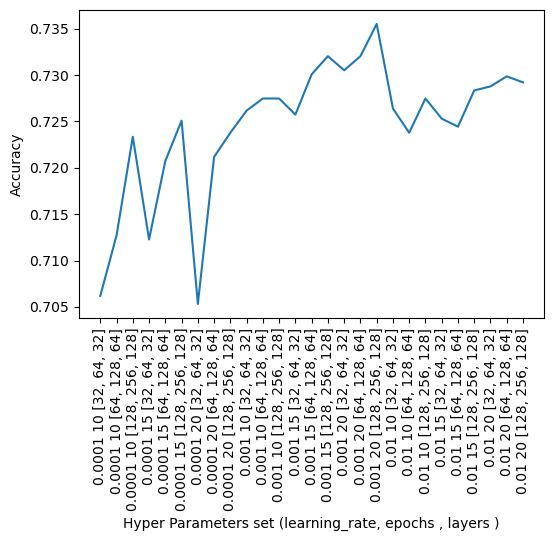

In [250]:
best_params , best_acc = hyper_p_tuning_fnn(x_train, x_dev, y_train , y_dev ,params)

In [251]:
print("After Development \n\n","Best Hyper Parameters are ",best_params ,"\n\n", "Best accuracy is ",best_acc)

After Development 

 Best Hyper Parameters are  {'learning_rate': 0.001, 'epochs': 20, 'layers': [128, 256, 128]} 

 Best accuracy is  0.735504885993485


Epoch 1/20


/Users/viratgowtham/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



260/260 ━━━━━━━━━━━━━━━━━━━━ 1s 818us/step - accuracy: 0.3586 - loss: 0.6158
Epoch 2/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - accuracy: 0.4307 - loss: 0.5763
Epoch 3/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 817us/step - accuracy: 0.4491 - loss: 0.5771
Epoch 4/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 821us/step - accuracy: 0.4294 - loss: 0.5743
Epoch 5/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - accuracy: 0.4340 - loss: 0.5746
Epoch 6/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 824us/step - accuracy: 0.4398 - loss: 0.5716
Epoch 7/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 880us/step - accuracy: 0.4403 - loss: 0.5688
Epoch 8/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 809us/step - accuracy: 0.4423 - loss: 0.5637
Epoch 9/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 811us/step - accuracy: 0.4427 - loss: 0.5658
Epoch 10/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 833us/step - accuracy: 0.4583 - loss: 0.5616
Epoch 11/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 0s 856us/step - accuracy: 0.4436 - loss: 0.5610
Epoch 12/20
260/260 ━━━━━━━━━━━━━━━━━━━━ 

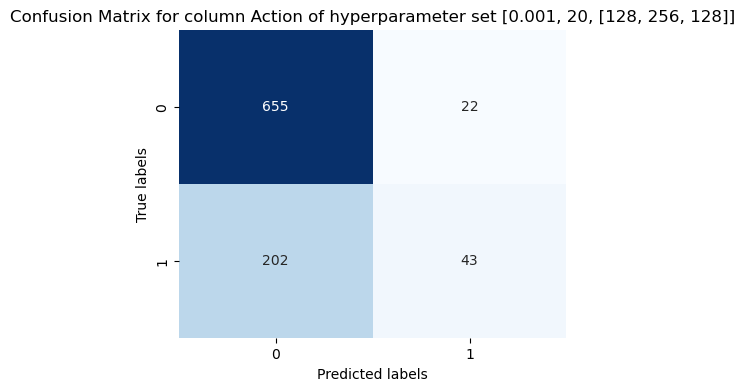

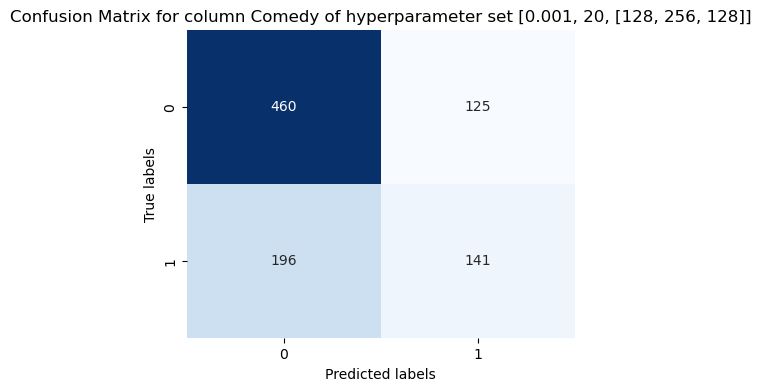

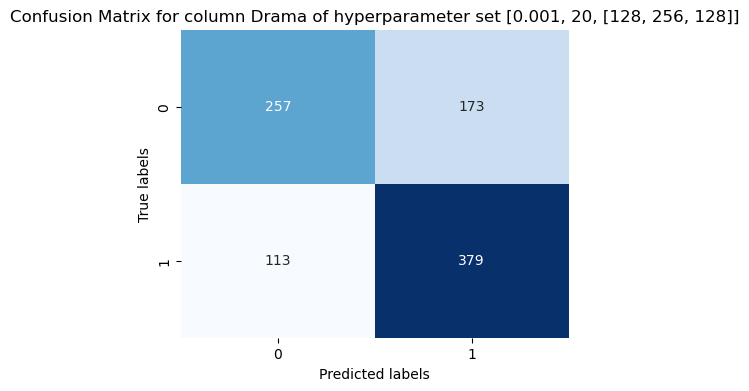

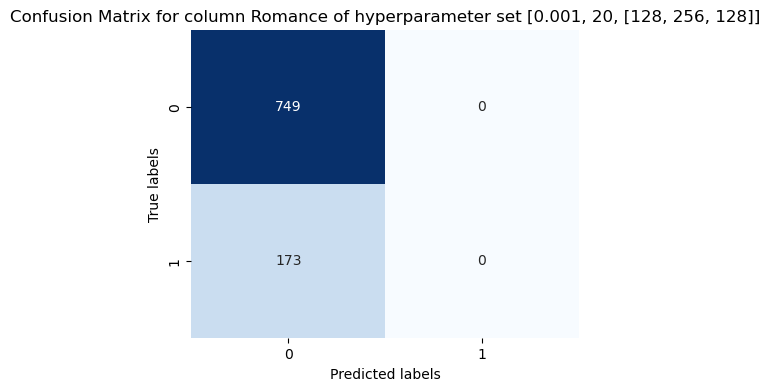

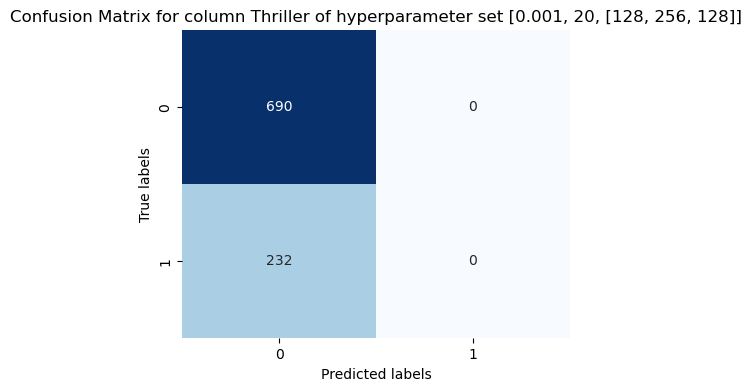

In [252]:
acc=fnn(pd.concat([x_train, x_dev]), x_test, pd.concat([y_train , y_dev]) , y_test ,best_params,True)

In [253]:
print("Test accuracy ",acc)

Test accuracy  0.7318872017353589
